In [2]:
import glob, os, sys
import numpy as np
import csv
import cv2
import pickle
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer
import tensorflow as tf
import PIL
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Dropout, Dense, Softmax)
from tensorflow.keras.applications import mobilenet as _mobilenet
import numpy as np
from PIL import Image
import networkx as nx
from IPython.display import Image as iImage
from IPython.display import display
import math
import matplotlib.pyplot as plt
import ebooklib
from ebooklib import epub
import random
import re
import os
import nltk
from nltk.corpus import words
import gensim
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from nltk.corpus import words, stopwords, names
from sklearn.decomposition import PCA
import scipy.spatial
from matplotlib import cm
import matplotlib.image as mpimg
import pandas as pd
import jieba
from sklearn.metrics.pairwise import linear_kernel
from nltk import pos_tag
from sklearn.metrics.pairwise import cosine_similarity
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
import sklearn
from matplotlib.colors import LinearSegmentedColormap


In [3]:
%cd D:\YeqinHUANG_Collection\ucl\Term3\skill\python

D:\YeqinHUANG_Collection\ucl\Term3\skill\python


# Train SOM

### photo to photo

In [4]:
# Return the (g,h) index of the BMU in the grid
def find_BMU(SOM,x):
    distSq = (np.square(SOM - x)).sum(axis=2)
    return np.unravel_index(np.argmin(distSq, axis=None), distSq.shape)

# Update the weights of the SOM cells when given a single training example
# and the model parameters along with BMU coordinates as a tuple
def update_weights(SOM, train_ex, learn_rate, radius_sq,
                   BMU_coord, step=3):
    g, h = BMU_coord
    #if radius is close to zero then only BMU is changed
    if radius_sq < 1e-3:
        SOM[g,h,:] += learn_rate * (train_ex - SOM[g,h,:])
        return SOM
    # Change all cells in a small neighborhood of BMU
    for i in range(max(0, g-step), min(SOM.shape[0], g+step)):
        for j in range(max(0, h-step), min(SOM.shape[1], h+step)):
            dist_sq = np.square(i - g) + np.square(j - h)
            dist_func = np.exp(-dist_sq / 2 / radius_sq)
            SOM[i,j,:] += learn_rate * dist_func * (train_ex - SOM[i,j,:])
    return SOM

# Main routine for training an SOM. It requires an initialized SOM grid
# or a partially trained grid as parameter
def train_SOM(SOM, train_data, learn_rate = .1, radius_sq = 1,
             lr_decay = .1, radius_decay = .1, epochs = 10):
    learn_rate_0 = learn_rate
    radius_0 = radius_sq
    for epoch in np.arange(0, epochs):
        np.random.shuffle(train_data)
        for train_ex in train_data:
            g, h = find_BMU(SOM, train_ex)
            SOM = update_weights(SOM, train_ex,
                                 learn_rate, radius_sq, (g,h))
        # Update learning rate and radius
        learn_rate = learn_rate_0 * np.exp(-epoch * lr_decay)
        radius_sq = radius_0 * np.exp(-epoch * radius_decay)
    return SOM
import scipy
def calculateQE(SOM,data):
    sumSqDist = 0
    for d in data:
        g,h = find_BMU(SOM, d)
        v1 = SOM[g,h]
        v2 = d
        sumSqDist += scipy.spatial.distance.cdist([v1],[v2],'sqeuclidean')[0][0]
    QE = sumSqDist/len(data)
    return QE
    
# Return the (g,h) index of the BMU in the grid
def find_BMU_2(SOM,x):
    distSq = (np.square(SOM - x)).sum(axis=2)
    return np.unravel_index(np.argpartition(distSq, 2, axis=None)[2], distSq.shape)
    

def calculateTE(SOM, data):
    failed = 0
    for d in data:
        g1, h1 = find_BMU(SOM, d)
        g2, h2 = find_BMU_2(SOM, d)
        coord1 = np.array([g1, h1])
        coord2 = np.array([g2, h2])
        dist = euclidean(coord1, coord2)

        if dist > 1:
            failed += 1

    return failed / len(data)
    
def activate(train_data, SOM, p):
    normalP = normalise(train_data, p)
    activatedSOM = np.array([[euclidean(normalP, c) for c in r] for r in SOM])
    normalisedActivatedSOM = normalise(activatedSOM, activatedSOM)
    activatedSOM = (normalisedActivatedSOM -1)*(-1)
    return activatedSOM

def normalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    normalised_p = (p-min_d)/(max_d - min_d)
    return normalised_p

def denormalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    denormalised_p = p * (max_d - min_d) + min_d
    return denormalised_p

def euclidean(a, b):
    return np.linalg.norm(a-b)

def u_matrix(lattice):

    """Builds a U-matrix on top of the trained lattice.

        Parameters
        ---
        lattice : list

            The SOM generated lattice

        Returns
        ---
        The lattice of the shape (R,C):

        R - number of rows; C - number of columns;
        """
    X, Y, Z = lattice.shape
    u_values = np.empty((X,Y), dtype=np.float64) #初始化空矩阵存储计算出的距离值。矩阵大小与SOM的行数和列数相同

    for y in range(Y):
        for x in range(X):
            current = lattice[x,y]
            dist = 0
            num_neigh = 0
            #对每个节点，计算其与其周围的欧氏距离（上下左右及对角线）
            # left
            if x-1 >= 0:
                #middle
                vec = lattice[x-1,y]
                dist += euclidean(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #sup
                    vec = lattice[x-1, y-1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
                if y + 1 < Y:
                    # down
                    vec = lattice[x-1,y+1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
            # middle
            if y - 1 >= 0:
                # up
                vec = lattice[x,y-1]
                dist += euclidean(current, vec)
                num_neigh += 1
            # down
            if y + 1 < Y:
                vec = lattice[x,y+1]
                dist += euclidean(current, vec)
                num_neigh += 1
            # right
            if x + 1 < X:
                # middle
                vec = lattice[x+1,y]
                dist += euclidean(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #up
                    vec = lattice[x+1,y-1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
                if y + 1 < lattice.shape[1]:
                    # down
                    vec = lattice[x+1,y+1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
            u_values[x,y] = dist / num_neigh #计算与邻居节点的平均距离
    u_values = (u_values - 1) * -1
    return u_values

In [5]:
def load_image(img_file, target_size=(224,224)):
    X = np.zeros((1, *target_size, 3))
    X[0, ] = np.asarray(tf.keras.preprocessing.image.load_img(
        img_file, 
        target_size=target_size)
    )
    X = tf.keras.applications.mobilenet.preprocess_input(X)
    return X


def ensure_folder_exists(folder):
    if not os.path.exists(folder):
        os.makedirs(folder)


model = tf.keras.applications.mobilenet.MobileNet(
# The 3 is the three dimensions of the input: r,g,b.
  input_shape=(224, 224, 3), 
  include_top=False, 
  pooling='avg'
)

In [6]:
model.save_weights('database03_video')
model.load_weights('database03_video')

In [7]:
def processImage(imagePath, model):
    im = load_image(imagePath)
    f = model.predict(im)[0]
    return f

In [8]:
def extract_images_from_folders(main_folder_path):
    all_image_paths = []
    for root, dirs, files in os.walk(main_folder_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif')): 
                file_path = os.path.join(root, file)
                all_image_paths.append(file_path)
    return all_image_paths
main_folder_path = r'D:\YeqinHUANG_Collection\ucl\Term3\Portfolio\week3\museumReinaSofia'

all_image_paths = extract_images_from_folders(main_folder_path)
print("Total images found:", len(all_image_paths))

Total images found: 1383


In [9]:
all_image_paths[0]

'D:\\YeqinHUANG_Collection\\ucl\\Term3\\Portfolio\\week3\\museumReinaSofia\\ReinaSofia_0.jpg'

In [10]:
def read_csv_files(folder_path):
    files_list = []
    global_index = 0  

    for index, filename in enumerate(os.listdir(folder_path)):
        if filename.endswith('.csv'):
            file_path = os.path.join(folder_path, filename)

            with open(file_path, 'r', encoding='utf-8') as csvfile:
                reader = csv.DictReader(csvfile)

                for row_num, row in enumerate(reader, start=1):
                    file_info = {
                        'nr': global_index,  # 全局索引
                        'filename': row.get('Filename', ''),
                        'content': row.get('Text', ''),
                        'file_index': index,  # 文件索引
                        'row_index': row_num  # 当前文件内的行号
                    }
                    files_list.append(file_info)
                    global_index += 1

    return files_list

In [11]:
folder_path2 = r'D:\YeqinHUANG_Collection\ucl\Term3\Portfolio\week3\ReinaSofia'
texts2 = read_csv_files(folder_path2)

In [12]:
SPFiles = all_image_paths[:2400]

In [16]:
features5 = []
SPFiles_filtered = []

for path in SPFiles:
    try:
        feature = processImage(path, model)
        features5.append(feature)
        SPFiles_filtered.append(path)
    except Exception as e:
        print(f"Error processing {path}: {e}")

if len(SPFiles_filtered) != len(features5):
    raise ValueError("Filtered SPFiles and features5 must be the same length.")

featureImagePairs5 = [
    {'image': spfile, 'feature': feature}
    for spfile, feature in zip(SPFiles_filtered, features5)
]

print(f"Total pairs created: {len(featureImagePairs5)}")

1/1 [==============================] - 0s 25ms/step
Total pairs created: 1383


In [17]:
# import pickle

# with open('Database02_Museum.pkl', 'wb') as pickle_file:
#     pickle.dump(featureImagePairs5, pickle_file)

# print("Results have been saved to feature_image_pairs.pkl")

Results have been saved to feature_image_pairs.pkl


In [18]:
import pickle

# 读取 `pickle` 文件
with open('Database02_Museum.pkl', 'rb') as pickle_file:
    featureImagePairs5 = pickle.load(pickle_file)

In [19]:
featureImagePairs5[0]

{'image': 'D:\\YeqinHUANG_Collection\\ucl\\Term3\\Portfolio\\week3\\museumReinaSofia\\ReinaSofia_0.jpg',
 'feature': array([0.18213311, 1.8348762 , 0.        , ..., 0.        , 0.41940853,
        0.        ], dtype=float32)}

In [20]:
import os
def extract_filename(image_path):
    return os.path.basename(image_path)
texts2_dict = {item['filename']: item for item in texts2}
combined_data = []

for item in featureImagePairs5:
    image_filename = extract_filename(item['image'])

    if image_filename in texts2_dict:
        combined_item = {**item, **texts2_dict[image_filename]}  
        combined_data.append(combined_item)

print(f"Total combined items: {len(combined_data)}")

Total combined items: 1382


In [21]:
featureImagePairs6 = []

for data in combined_data:
    featureText = {}
    featureText['filename'] = data['filename']
    featureText['path'] = data['image']
    featureText['content'] = data['content']
    featureText['file_index'] = data['file_index']
    featureText['feature'] = data['feature']
    
    featureImagePairs6.append(featureText)

print(len(featureImagePairs6))

1382


In [19]:
# import pickle
# output_file_path = "featureImagePairs6.pkl"
# with open(output_file_path, "wb") as f:
#     pickle.dump(featureImagePairs6, f)
# print(f"Feature-image pairs saved to {output_file_path}")

Feature-image pairs saved to featureImagePairs6.pkl


In [22]:
import pickle
input_file_path = "featureImagePairs6.pkl"
with open(input_file_path, "rb") as f:
    featureImagePairs6 = pickle.load(f)

In [23]:
featureImagePairs6[0]

{'filename': 'ReinaSofia_0.jpg',
 'path': 'D:\\YeqinHUANG_Collection\\ucl\\Term3\\Portfolio\\week3\\museumReinaSofia\\ReinaSofia_0.jpg',
 'content': 'In the image, there are various objects, including abstract art, a painting, and a piece of furniture. The artwork is painted on a canvas and features a gray and yellow color scheme. The painting is surrounded by various objects, including chairs and a table. The chairs are placed around the painting, with one chair close to the painting and another chair further away',
 'file_index': 0,
 'feature': array([0.18213311, 1.8348762 , 0.        , ..., 0.        , 0.41940853,
        0.        ], dtype=float32)}

In [24]:
colors = [
    (0, "#e9fcfa"),  # 绿
    (0.4, "#a6f3e9"),  # 绿
    (0.8, "#ffe6ef"),  # 粉
    (1, "#ffb3cd")  # 粉
]
cmap = LinearSegmentedColormap.from_list('custom_cmap', colors)

In [25]:
# Dimensions of the SOM grid
m = 14
n = 14
train_data5 = [pair['feature'] for pair in featureImagePairs6]
n_train_data5 = normalise(train_data5, train_data5)

0
1
2
3


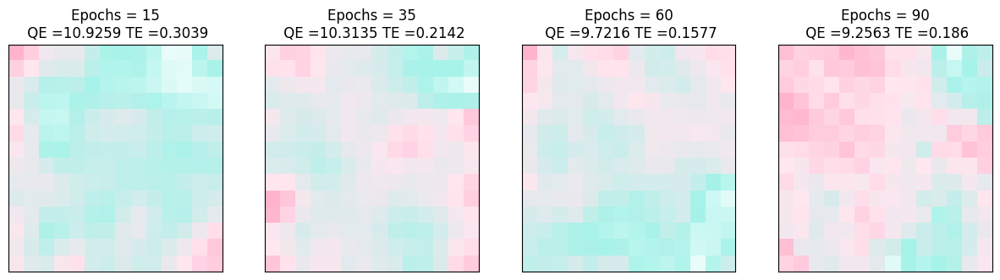

In [24]:
from matplotlib.colors import LinearSegmentedColormap
total_epochs = 0
SOMS5 = []
vector_size = 1024 
fig, ax = plt.subplots(
    nrows=1, ncols=4, figsize=(15, 3.5), 
    subplot_kw=dict(xticks=[], yticks=[]))

for epochs, i in zip([15, 20, 25, 30], range(0,4)):
    print(i)
    total_epochs += epochs
    rand = np.random.RandomState(0)
    SOM5 = rand.uniform(0,1,(m,n,vector_size))
    SOM5 = train_SOM(SOM5, n_train_data5, learn_rate = .5, radius_sq = 7, epochs = epochs)
    SOMS5.append(SOM5)
    QE = round(calculateQE(SOM5, n_train_data5), 4)
    TE = round(calculateTE(SOM5, n_train_data5), 4)
    
    ax[i].imshow(u_matrix(SOM5),cmap=cmap,aspect='auto')
    ax[i].title.set_text('Epochs = ' + str(total_epochs) + '\n QE =' + str(QE) + ' TE =' + str(TE))

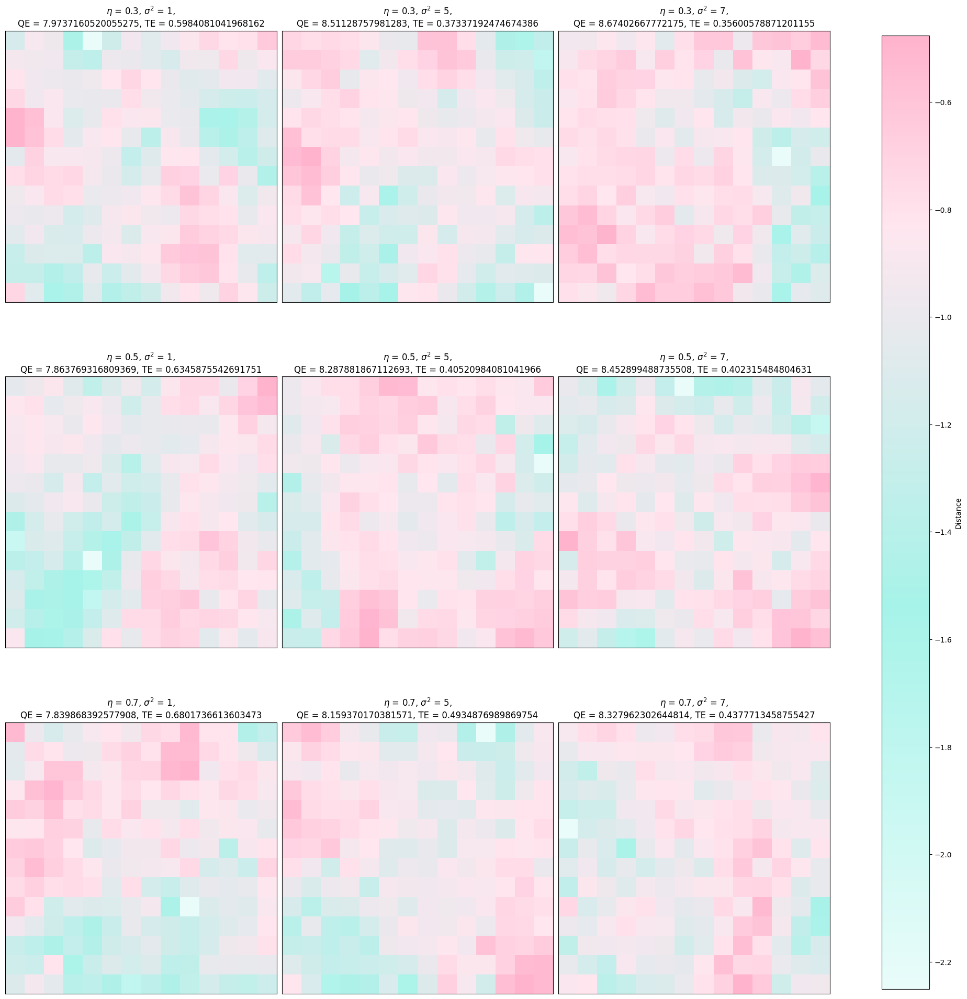

In [42]:
soms5 = []
learn_rates = [0.3, 0.5, 0.7]
radiuses = [1, 5, 7]
m, n = 14, 14
vector_size = 1024

for learn_rate in learn_rates:
    for radius in radiuses:
        rand = np.random.RandomState(0)
        SOM5 = rand.uniform(0, 1, (m, n, vector_size))
        SOM5 = train_SOM(SOM5, n_train_data5, epochs=50, learn_rate=learn_rate, radius_sq=radius)
        soms5.append(SOM5)

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 20), subplot_kw=dict(xticks=[], yticks=[]))
param_combinations = [(lr, rsq) for lr in learn_rates for rsq in radiuses]

for s, ax, (learn_rate, radius_sq) in zip(soms5, axes.flat, param_combinations):
    u_matrix_values = u_matrix(s)
    im = ax.imshow(u_matrix_values, cmap=cmap)
    QE = round(calculateQE(s, n_train_data5), 250)
    TE = round(calculateTE(s, n_train_data5), 250)
    ax.set_title(f'$\eta$ = {learn_rate}, $\sigma^2$ = {radius_sq},\nQE = {QE}, TE = {TE}')

plt.tight_layout()
cbar = plt.colorbar(im, ax=axes.ravel().tolist(), shrink=0.95)
cbar.set_label('Distance')
plt.show()

In [43]:
SOM5 = soms5[2]

In [44]:
# with open('Database02_MuseumPhotoSOM.pkl', 'wb') as f:
#     pickle.dump(SOM5, f)

In [26]:
import pickle
with open('Database02_MuseumPhotoSOM.pkl', 'rb') as f:
    SOM5= pickle.load(f)

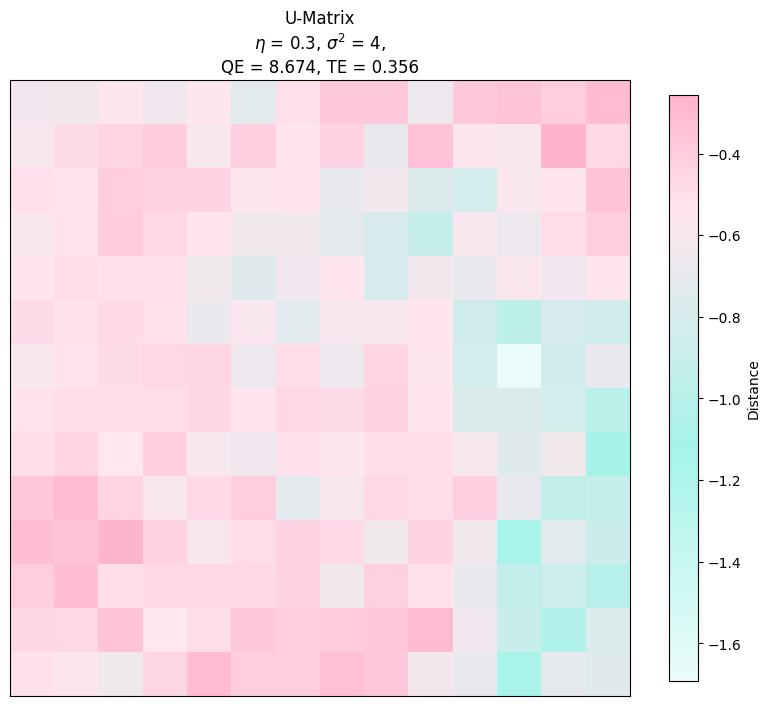

In [27]:
u_matrix_values = u_matrix(SOM5)
QE = round(calculateQE(SOM5, n_train_data5), 4)
TE = round(calculateTE(SOM5, n_train_data5), 4)

plt.figure(figsize=(10, 8))
im = plt.imshow(u_matrix_values, cmap=cmap, aspect='auto')
plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
plt.colorbar(im, shrink=0.95, label='Distance')
plt.xticks([])
plt.yticks([])
plt.show()

In [28]:
SOMimages = []
for i in range(len(SOM5)):
    row5 = []
    for j in range(len(SOM5[0])):
        row5.append([])
    SOMimages.append(row5)

In [29]:
for fi in featureImagePairs5:
    g,h = find_BMU(SOM5, normalise(train_data5, fi['feature']))
    SOMimages[g][h].append(fi)

In [30]:
[[len(c) for c in r] for r in SOMimages]

[[13, 6, 9, 11, 8, 13, 11, 10, 6, 15, 8, 10, 14, 17],
 [10, 4, 6, 2, 6, 2, 7, 6, 8, 1, 6, 7, 1, 8],
 [13, 5, 9, 8, 5, 8, 4, 7, 3, 6, 11, 7, 7, 11],
 [6, 6, 4, 7, 5, 8, 4, 7, 7, 7, 6, 8, 3, 5],
 [11, 5, 6, 7, 6, 3, 4, 5, 7, 3, 5, 2, 5, 13],
 [12, 6, 7, 6, 6, 5, 7, 7, 7, 7, 5, 7, 4, 12],
 [8, 8, 7, 9, 5, 11, 3, 9, 5, 8, 5, 6, 1, 3],
 [11, 4, 6, 7, 5, 7, 3, 9, 6, 7, 5, 3, 1, 12],
 [10, 7, 10, 3, 8, 9, 6, 6, 8, 8, 11, 9, 1, 9],
 [16, 2, 9, 12, 4, 2, 9, 6, 4, 4, 1, 8, 5, 6],
 [10, 7, 1, 5, 9, 7, 5, 6, 12, 8, 4, 10, 0, 13],
 [13, 4, 8, 5, 5, 7, 5, 10, 6, 9, 13, 3, 0, 12],
 [8, 4, 1, 9, 12, 6, 4, 5, 4, 1, 5, 2, 3, 6],
 [15, 7, 11, 14, 7, 13, 15, 10, 14, 16, 4, 11, 2, 18]]

In [31]:
def distance_between(a, b):
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    return np.linalg.norm(a - b)

In [32]:
def find_closest_image_index(distance):
    closest_index = 0
    distance_closest = distance[0]

    for index in range(1, len(distance)):
        if distance[index] < distance_closest:
            distance_closest = distance[index]
            closest_index = index

    return closest_index

In [33]:
def get_closest_image(a,b):
    cell = SOM5[a][b]
    distance = [distance_between(cell, i['feature']) for i in SOMimages[a][b]]
    closest_image_index=find_closest_image_index(distance)
    return closest_image_index

In [34]:
def img_reshape(img):
    img_path = os.path.join(main_folder_path, img)
    img = Image.open(img_path).convert('RGB')
    img = img.resize((100, 100))
    img = np.asarray(img)
    return img

In [35]:
from mpl_toolkits.axes_grid1 import ImageGrid
def generate_SOMimages_grid(SOMimages):
    imageGrid = []
    for g in range(len(SOMimages)):
        row = SOMimages[g]
        for h in range(len(row)):
            cell = row[h]
            if len(cell) > 0:
                closest_image_index=get_closest_image(g,h)
                imageGrid.append(cell[closest_image_index]['image'])
            else:
                imageGrid.append('white.png')
            
    img_arr = []
    for image in imageGrid:
        img_arr.append(img_reshape(image))
        
    fig = plt.figure(figsize=(20., 20.))
    grid = ImageGrid(fig, 111,
                     nrows_ncols=(14, 14),  # creates 2x2 grid of axes
                     axes_pad=0.1,  # pad between axes
                    ) 
    
    for ax, im in zip(grid, img_arr):
        ax.imshow(im)
        ax.axis('off')
    SOMimages_grid=plt.show()
    
    return SOMimages_grid

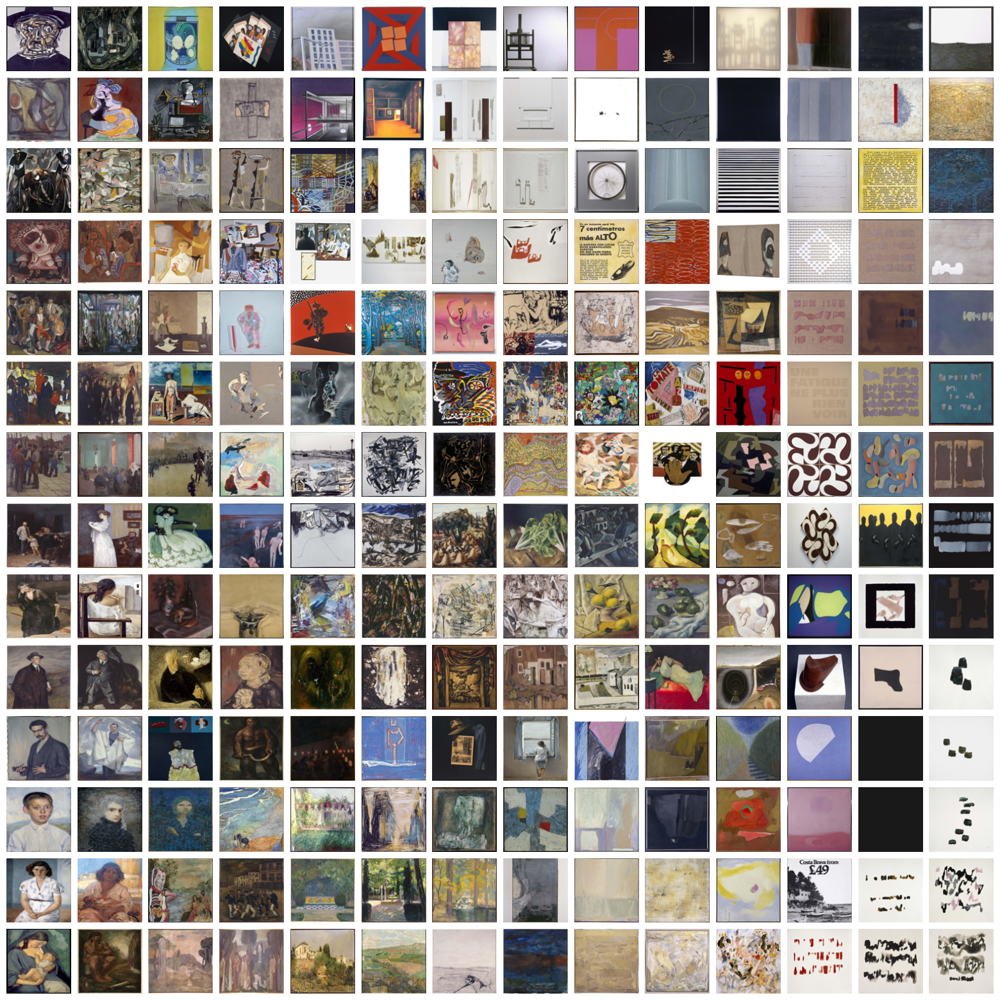

In [58]:
generate_SOMimages_grid(SOMimages)

In [36]:
video_picture_data_dict2 = [[[] for _ in range(len(SOM5[0]))] for _ in range(len(SOM5))]

# 遍历每个格子中的列表
for row in SOMimages:
    for cell in row:
        for item in cell:
            if not isinstance(item, dict) or 'feature' not in item or 'image' not in item:
                continue

            features = item['feature']
            path = item['image']

            g, h = find_BMU(SOM5, features)

            if 0 <= g < len(SOM5) and 0 <= h < len(SOM5[0]):
                video_picture_data_dict2[g][h].append({'features': features, 'image': path})
            else:
                print(f"Warning: Index out of range ({g}, {h}) for path: {path}")


In [37]:
def get_closest_image2(a,b):
  cell = SOM5[a][b]
  distance = [distance_between(cell, i['features']) for i in video_picture_data_dict2[a][b]]
  closest_image_index=find_closest_image_index(distance)
  return closest_image_index

In [61]:
# def searchvideopicturesom5(query):
#     result = []
#     query_features = []
#     path = query
#     q_f = processImage(path, model)
#     query_features.append(q_f)

#     # 调试信息
#     print(f"Query features shape: {np.array(query_features).shape}")
#     activatedSOM = activate(n_train_data5, SOM5, query_features)

#     # 检查 BMU 查找是否正常
#     g, h = find_BMU(SOM5, query_features[0])
#     print(f"BMU location: ({g}, {h})")

#     # 显示 U-Matrix 结果
#     plt.figure(figsize=(5, 4))
#     im = plt.imshow(activatedSOM, cmap=cmap, aspect='auto')
#     plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4}')
#     plt.colorbar(im, shrink=0.95, label='Distance')
#     plt.xticks([])
#     plt.yticks([])
#     plt.show()

#     # 获取最近的图像索引
#     closest_image_index = get_closest_image2(g, h)
#     result.append(video_picture_data_dict2[g][h][closest_image_index]['image'])
#     return result

In [194]:
def searchvideopicturesom5(query):
    result = []
    query_features = []
    path = query
    q_f = processImage(path, model)
    query_features.append(q_f)

    # 调试信息
    print(f"Query features shape: {np.array(query_features).shape}")
    activatedSOM = activate(n_train_data5, SOM5, query_features)

    # 检查 BMU 查找是否正常
    g, h = find_BMU(SOM5, query_features[0])
    print(f"BMU location: ({g}, {h})")

    # 显示 U-Matrix 结果
    plt.figure(figsize=(5, 4))
    im = plt.imshow(activatedSOM, cmap=cmap, aspect='auto')
    plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4}')
    plt.colorbar(im, shrink=0.95, label='Distance')
    plt.xticks([])
    plt.yticks([])
    plt.show()

    # 获取最近的图像索引
    closest_image_index = get_closest_image2(g, h)
    
    # 获取最近图像的路径和内容
    closest_image_info = video_picture_data_dict2[g][h][closest_image_index]
    
    for index, item in enumerate(featureImagePairs6):
        if item['path'] == closest_image_info['image']:
            result.append({'image': closest_image_info['image'], 
                           'path': item['path'], 
                           'content': item['content']})
            break
    
    return result

1/1 [==============================] - 0s 27ms/step
Query features shape: (1, 1024)
BMU location: (13, 0)


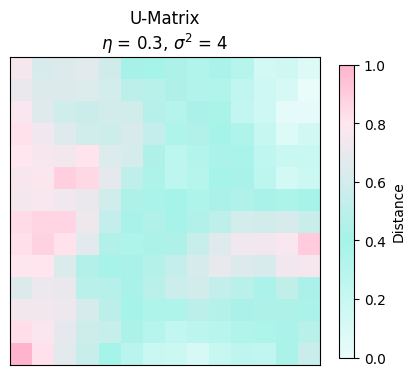

In [195]:
query = r'D:\YeqinHUANG_Collection\ucl\Term3\Portfolio\week3\museumPrado\Prado_111.jpg'
result5 = searchvideopicturesom5(query)

In [196]:
result5

[{'image': 'D:\\YeqinHUANG_Collection\\ucl\\Term3\\Portfolio\\week3\\museumReinaSofia\\ReinaSofia_1212.jpg',
  'path': 'D:\\YeqinHUANG_Collection\\ucl\\Term3\\Portfolio\\week3\\museumReinaSofia\\ReinaSofia_1212.jpg',
  'content': "In the painting, there is a woman wearing a blue shirt and standing with her arms crossed. The woman's arms are held together, and her posture is relaxed. Additionally, there are multiple books scattered around her, suggesting that she might be reading or possibly working on a project. The scene conveys a sense of calmness and leisure, as the woman enjoys her time"}]

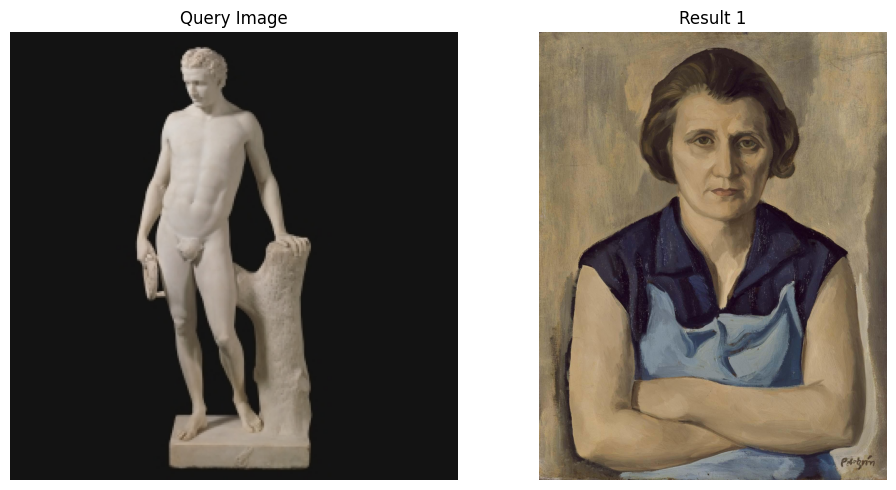

In [201]:
import matplotlib.pyplot as plt
from PIL import Image

def show_query_and_results(query_image_path, result_image_paths):
    image_paths = [query_image_path] + [item['image'] for item in result_image_paths]
    titles = ["Query Image"] + [f"Result {i+1}" for i in range(len(result_image_paths))]

    # 确定布局，按行数显示
    n_images = len(image_paths)
    fig, axes = plt.subplots(1, n_images, figsize=(5 * n_images, 5))

    if n_images == 1:
        axes = [axes]

    for ax, path, title in zip(axes, image_paths, titles):
        try:
            # 使用 PIL 加载图像
            image = Image.open(path)
            ax.imshow(image)
            ax.axis('off')
            ax.set_title(title)
        except Exception as e:
            ax.set_title(f"Error: {e}")
            ax.axis('off')

    plt.tight_layout()
    plt.show()

show_query_and_results(query, result5)


In [135]:
contents = [item['content'] for item in result5]

In [136]:
contents

["In the painting, there is a woman wearing a blue shirt and standing with her arms crossed. The woman's arms are held together, and her posture is relaxed. Additionally, there are multiple books scattered around her, suggesting that she might be reading or possibly working on a project. The scene conveys a sense of calmness and leisure, as the woman enjoys her time"]

### photo to txt

In [50]:
def calculateQE(SOM,data):
    sumSqDist = 0
    for d in data:
        g,h = find_BMU(SOM, d)
        v1 = SOM[g,h]
        v2 = d
        sumSqDist += scipy.spatial.distance.cdist([v1],[v2],'cosine')[0][0]
    QE = sumSqDist/len(data)
    return QE

def calculateTE(SOM, data):
        failed = 0
        for d in data:
            g1, h1 = find_BMU1(SOM, d)
            g2, h2 = find_BMU_2(SOM, d)
            dist = scipy.spatial.distance.cityblock([g1, h1], [g2, h2])
            if dist > 1:
                failed += 1
        return failed / len(data)

def find_BMU_2(SOM,x):
    somShape = SOM.shape
    simSOM = SOM.reshape((-1, len(x)))
    cos_sims = cosine_similarity([x], simSOM).reshape(somShape[:2])
    return np.unravel_index(np.argpartition(cos_sims, -2, axis=None)[-2], cos_sims.shape)

def normalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    normalised_p = (p-min_d)/(max_d - min_d)
    return normalised_p

def denormalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    denormalised_p = p * (max_d - min_d) + min_d
    return denormalised_p

def cosine(a,b):
    return cosine_similarity([a], [b])[0][0]

def u_matrix(lattice):
    X, Y, Z = lattice.shape
    u_values = np.empty((X, Y), dtype=np.float64)

    for y in range(Y):
        for x in range(X):
            current = lattice[x, y]
            dist = 0
            num_neigh = 0

            # 左侧邻居及对角线
            if x - 1 >= 0:
                vec = lattice[x - 1, y]
                dist += cosine(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    vec = lattice[x - 1, y - 1]
                    dist += cosine(current, vec)
                    num_neigh += 1
                if y + 1 < Y:
                    vec = lattice[x - 1, y + 1]
                    dist += cosine(current, vec)
                    num_neigh += 1

            # 上方和下方邻居
            if y - 1 >= 0:
                vec = lattice[x, y - 1]
                dist += cosine(current, vec)
                num_neigh += 1
            if y + 1 < Y:
                vec = lattice[x, y + 1]
                dist += cosine(current, vec)
                num_neigh += 1

            # 右侧邻居及对角线
            if x + 1 < X:
                vec = lattice[x + 1, y]
                dist += cosine(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    vec = lattice[x + 1, y - 1]
                    dist += cosine(current, vec)
                    num_neigh += 1
                if y + 1 < Y:
                    vec = lattice[x + 1, y + 1]
                    dist += cosine(current, vec)
                    num_neigh += 1

            u_values[x, y] = dist / num_neigh

    u_values = (u_values - 1) * -1
    return u_values

def euclidean(a, b):
    return np.linalg.norm(a - b)

def update_weights(SOM, train_ex, learn_rate, radius_sq,
                   BMU_coord, step=3):
    g, h = BMU_coord
    #if radius is close to zero then only BMU is changed
    if radius_sq < 1e-3:
        SOM[g,h,:] += learn_rate * (train_ex - SOM[g,h,:])
        return SOM
    # Change all cells in a small neighborhood of BMU
    for i in range(max(0, g-step), min(SOM.shape[0], g+step)):
        for j in range(max(0, h-step), min(SOM.shape[1], h+step)):
            dist_sq = np.square(i - g) + np.square(j - h)
            dist_func = np.exp(-dist_sq / 2 / radius_sq)
            SOM[i,j,:] += learn_rate * dist_func * (train_ex - SOM[i,j,:])
    return SOM

# Main routine for training an SOM. It requires an initialized SOM grid
# or a partially trained grid as parameter
def train_SOM(SOM, train_data, learn_rate = .1, radius_sq = 1, lr_decay = .1, radius_decay = .1, epochs = 10):
    learn_rate_0 = learn_rate
    radius_0 = radius_sq
    for epoch in np.arange(0, epochs):
        rand.shuffle(train_data)
        for i, train_ex in enumerate(train_data):
            g, h = find_BMU(SOM, train_ex)
            SOM = update_weights(SOM, train_ex,
                                 learn_rate, radius_sq, (g,h))
            print(f"Epoch {epoch+1}/{epochs}, Sample {i+1}/{len(train_data)}", end="\r")
        # Update learning rate and radius
        learn_rate = learn_rate_0 * np.exp(-epoch * lr_decay)
        radius_sq = radius_0 * np.exp(-epoch * radius_decay)
    return SOM


def normalise_2(train):
    min_d = np.min(train, axis=0)
    max_d = np.max(train, axis=0)
    normalised_train = (train - min_d) / (max_d - min_d)
    return normalised_train

def find_closest_cos(data, v):
    cos_dist = cosine_similarity(data, [v])
    return np.argmax(cos_dist)
    
def find_BMU(SOM,x):
    somShape = SOM.shape
    simSOM = SOM.reshape((-1, len(x)))
    cos_sims = cosine_similarity([x], simSOM).reshape(somShape[:2])
    return np.unravel_index(np.argmax(cos_sims, axis=None), cos_sims.shape)
    
def find_BMU1(SOM,x):
    somShape = SOM.shape
    simSOM = SOM.reshape((-1, len(x)))
    cos_sims = cosine_similarity([x], simSOM).reshape(somShape[:2])
    return np.unravel_index(np.argmax(cos_sims, axis=None), cos_sims.shape)

def activate1(train_data, SOM, p):
    # normalP = normalise(train_data, p)
    activatedSOM = np.array([[cosine_similarity([p], [c])[0][0] for c in r] for r in SOM])
    normalisedActivatedSOM = normalise(activatedSOM, activatedSOM)
    #activatedSOM = (normalisedActivatedSOM -1)*(-1)
    return activatedSOM

In [51]:
with open('Doc2Vec_txtBookSOM.pkl', 'rb') as f:
    SOM1 = pickle.load(f)

In [52]:
input_file_path = "train_data1.pkl"
with open(input_file_path, "rb") as f:
    train_data1 = pickle.load(f)

In [53]:
input_file_path = "PARAGRAPHS.pkl"
with open(input_file_path, "rb") as f:
    PARAGRAPHS = pickle.load(f)

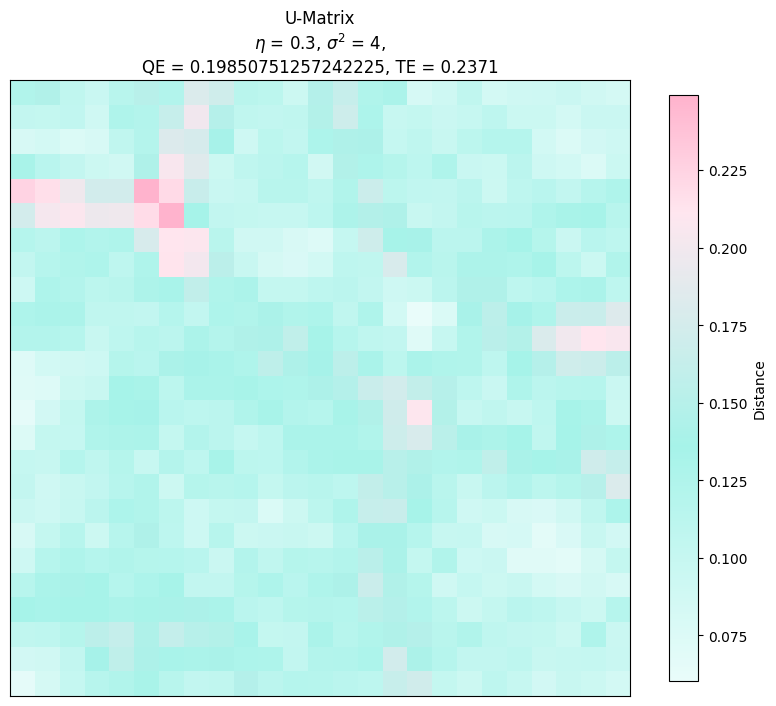

In [49]:
u_matrix_values = u_matrix(SOM1)
QE = round(calculateQE(SOM1, train_data1), 250)
TE = round(calculateTE(SOM1, train_data1), 250)

plt.figure(figsize=(10, 8))
im = plt.imshow(u_matrix_values, cmap=cmap, aspect='auto')
plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
plt.colorbar(im, shrink=0.95, label='Distance')
plt.xticks([])
plt.yticks([])
plt.show()

In [54]:
PARAGRAPHS1 = PARAGRAPHS[:10000]

In [55]:
PREPROCESSED2 = []
with open('PREPROCESSED2.txt', 'r', encoding='utf-8') as f: 
    for line in f:  
        PREPROCESSED2.append(line.strip())

In [56]:
PREPROCESSED2_10000 = PREPROCESSED2[:10000]
len(PREPROCESSED2_10000)

10000

In [57]:
from gensim.models.doc2vec import TaggedDocument, Doc2Vec

In [58]:
DOC2VEC_DOCUMENTS = [TaggedDocument(doc, [i]) for i, doc in enumerate(PREPROCESSED2_10000)]

DOC2VEC_MODEL = Doc2Vec(vector_size=250, min_count=0, alpha=0.025, min_alpha=0.025, epochs=100)
DOC2VEC_MODEL.build_vocab(DOC2VEC_DOCUMENTS)
DOC2VEC_MODEL.train(DOC2VEC_DOCUMENTS, total_examples=DOC2VEC_MODEL.corpus_count, epochs=100)

In [59]:
data_dict1 = []
for i in range(len(SOM1)):
    row = []
    for j in range(len(SOM1[0])):
        row.append([])
    data_dict1.append(row)
vectortextPairs=[]
for i in range(0,len(PARAGRAPHS1)):
    vectortext={}
    vectortext['text']=PARAGRAPHS1[i]
    vectortext['vector']=train_data1[i]
    vectortextPairs.append(vectortext)
for i in vectortextPairs:
    g,h = find_BMU(SOM1,i['vector'])
    data_dict1[g][h].append(i)

In [60]:
def preprocess2(paragraphs):
    lemmatizer = WordNetLemmatizer()
    STOP_WORDS = set(stopwords.words("english"))

    processed_docs = []

    for paragraph in paragraphs:
        words = gensim.utils.simple_preprocess(paragraph, min_len=3, deacc=True)
        lemmatized_words = [lemmatizer.lemmatize(word) for word in words]
        filtered_words = [word for word in lemmatized_words if word not in STOP_WORDS]
        processed_docs.append(filtered_words)
    
    return processed_docs

In [61]:
def search_TextSom1(SOM1, model, data_dict1, query='street'):
    result = []

    # 处理查询
    query = [query]
    preprocessed_query = preprocess2(query)
    query_vector = DOC2VEC_MODEL.infer_vector(preprocessed_query[0])

    # 激活并显示 SOM
    fig = plt.figure()
    plt.figure(figsize=(5, 5))
    plt.imshow(activate1(train_data1, SOM1, query_vector), cmap=cmap)
    plt.show()

    # 查找 BMU 位置
    g, h = find_BMU1(SOM1, query_vector)
    print((g, h))

    # 检查 BMU 单元是否为空
    if g >= len(data_dict1) or h >= len(data_dict1[g]) or not data_dict1[g][h]:
        print("No data found for this BMU.")
        return []

    # 计算相似度并找到最相似的段落
    similarities = {}
    for i in data_dict1[g][h]:
        vector_array = np.array([i['vector']])
        vector_array = vector_array.reshape(1, -1)
        similarities[i['text']['paragraph']] = cosine_similarity(vector_array, [SOM1[g][h]])[0][0]

    # 找到最相似的段落
    if similarities:
        biggest = max(similarities, key=similarities.get)
        result.append(biggest)
    else:
        print("No similarities found.")

    return result

In [62]:
contents

['In the image, there is a painting of a woman sitting at a table. The painting is painted on a canvas and depicts a woman wearing a blue dress. Additionally, there is a chair next to the woman, and a vase is also visible on the table.\n']

<Figure size 640x480 with 0 Axes>

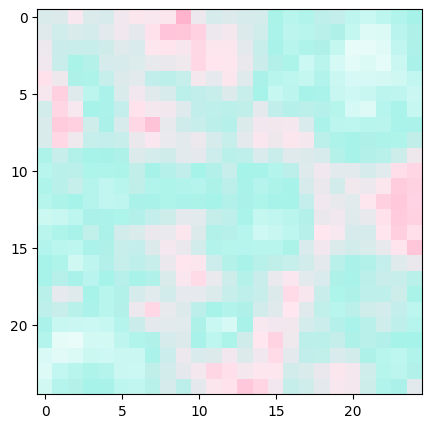

(0, 9)


[' 1.F.3. LIMITED RIGHT OF REPLACEMENT OR REFUND - If you discover a defect in this electronic work within 90 days of receiving it, you can receive a refund of the money (if any) you paid for it by sending a written explanation to the person you received the work from.']

In [63]:
search_TextSom1(SOM1,DOC2VEC_MODEL,data_dict1,contents[0])

# photo to video

In [93]:
Path = [item['image'] for item in result5]

In [94]:
Path

['D:\\YeqinHUANG_Collection\\ucl\\Term3\\Portfolio\\week3\\museumReinaSofia\\ReinaSofia_943.jpg']

In [66]:
# Return the (g,h) index of the BMU in the grid
def find_BMU(SOM,x):
    distSq = (np.square(SOM - x)).sum(axis=2)
    return np.unravel_index(np.argmin(distSq, axis=None), distSq.shape)

# Update the weights of the SOM cells when given a single training example
# and the model parameters along with BMU coordinates as a tuple
def update_weights(SOM, train_ex, learn_rate, radius_sq,
                   BMU_coord, step=3):
    g, h = BMU_coord
    #if radius is close to zero then only BMU is changed
    if radius_sq < 1e-3:
        SOM[g,h,:] += learn_rate * (train_ex - SOM[g,h,:])
        return SOM
    # Change all cells in a small neighborhood of BMU
    for i in range(max(0, g-step), min(SOM.shape[0], g+step)):
        for j in range(max(0, h-step), min(SOM.shape[1], h+step)):
            dist_sq = np.square(i - g) + np.square(j - h)
            dist_func = np.exp(-dist_sq / 2 / radius_sq)
            SOM[i,j,:] += learn_rate * dist_func * (train_ex - SOM[i,j,:])
    return SOM

# Main routine for training an SOM. It requires an initialized SOM grid
# or a partially trained grid as parameter
def train_SOM(SOM, train_data, learn_rate = .1, radius_sq = 1,
             lr_decay = .1, radius_decay = .1, epochs = 10):
    learn_rate_0 = learn_rate
    radius_0 = radius_sq
    for epoch in np.arange(0, epochs):
        np.random.shuffle(train_data)
        for train_ex in train_data:
            g, h = find_BMU(SOM, train_ex)
            SOM = update_weights(SOM, train_ex,
                                 learn_rate, radius_sq, (g,h))
        # Update learning rate and radius
        learn_rate = learn_rate_0 * np.exp(-epoch * lr_decay)
        radius_sq = radius_0 * np.exp(-epoch * radius_decay)
    return SOM
import scipy
def calculateQE(SOM,data):
    sumSqDist = 0
    for d in data:
        g,h = find_BMU(SOM, d)
        v1 = SOM[g,h]
        v2 = d
        sumSqDist += scipy.spatial.distance.cdist([v1],[v2],'sqeuclidean')[0][0]
    QE = sumSqDist/len(data)
    return QE
    
# Return the (g,h) index of the BMU in the grid
def find_BMU_2(SOM,x):
    distSq = (np.square(SOM - x)).sum(axis=2)
    return np.unravel_index(np.argpartition(distSq, 2, axis=None)[2], distSq.shape)
    

def calculateTE(SOM, data):
    failed = 0
    for d in data:
        g1, h1 = find_BMU(SOM, d)
        g2, h2 = find_BMU_2(SOM, d)
        coord1 = np.array([g1, h1])
        coord2 = np.array([g2, h2])
        dist = euclidean(coord1, coord2)

        if dist > 1:
            failed += 1

    return failed / len(data)
    
def activate(train_data, SOM, p):
    normalP = normalise(train_data, p)
    activatedSOM = np.array([[euclidean(normalP, c) for c in r] for r in SOM])
    normalisedActivatedSOM = normalise(activatedSOM, activatedSOM)
    activatedSOM = (normalisedActivatedSOM -1)*(-1)
    return activatedSOM

def normalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    normalised_p = (p-min_d)/(max_d - min_d)
    return normalised_p

def denormalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    denormalised_p = p * (max_d - min_d) + min_d
    return denormalised_p

def euclidean(a, b):
    return np.linalg.norm(a-b)

def u_matrix(lattice):

    """Builds a U-matrix on top of the trained lattice.

        Parameters
        ---
        lattice : list

            The SOM generated lattice

        Returns
        ---
        The lattice of the shape (R,C):

        R - number of rows; C - number of columns;
        """
    X, Y, Z = lattice.shape
    u_values = np.empty((X,Y), dtype=np.float64) #初始化空矩阵存储计算出的距离值。矩阵大小与SOM的行数和列数相同

    for y in range(Y):
        for x in range(X):
            current = lattice[x,y]
            dist = 0
            num_neigh = 0
            #对每个节点，计算其与其周围的欧氏距离（上下左右及对角线）
            # left
            if x-1 >= 0:
                #middle
                vec = lattice[x-1,y]
                dist += euclidean(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #sup
                    vec = lattice[x-1, y-1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
                if y + 1 < Y:
                    # down
                    vec = lattice[x-1,y+1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
            # middle
            if y - 1 >= 0:
                # up
                vec = lattice[x,y-1]
                dist += euclidean(current, vec)
                num_neigh += 1
            # down
            if y + 1 < Y:
                vec = lattice[x,y+1]
                dist += euclidean(current, vec)
                num_neigh += 1
            # right
            if x + 1 < X:
                # middle
                vec = lattice[x+1,y]
                dist += euclidean(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #up
                    vec = lattice[x+1,y-1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
                if y + 1 < lattice.shape[1]:
                    # down
                    vec = lattice[x+1,y+1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
            u_values[x,y] = dist / num_neigh #计算与邻居节点的平均距离
    u_values = (u_values - 1) * -1
    return u_values


In [67]:
import pickle
with open('Database03_VideoFrameSOM2.pkl', 'rb') as f:
    SOM7= pickle.load(f)

In [69]:
import pickle
with open('VideoSOMFeatures.pkl', 'rb') as pickle_file:
    image_features_dict = pickle.load(pickle_file)

In [70]:
train_data7 = [pair['feature'] for pair in image_features_dict]
n_train_data7 = normalise(train_data7, train_data7)

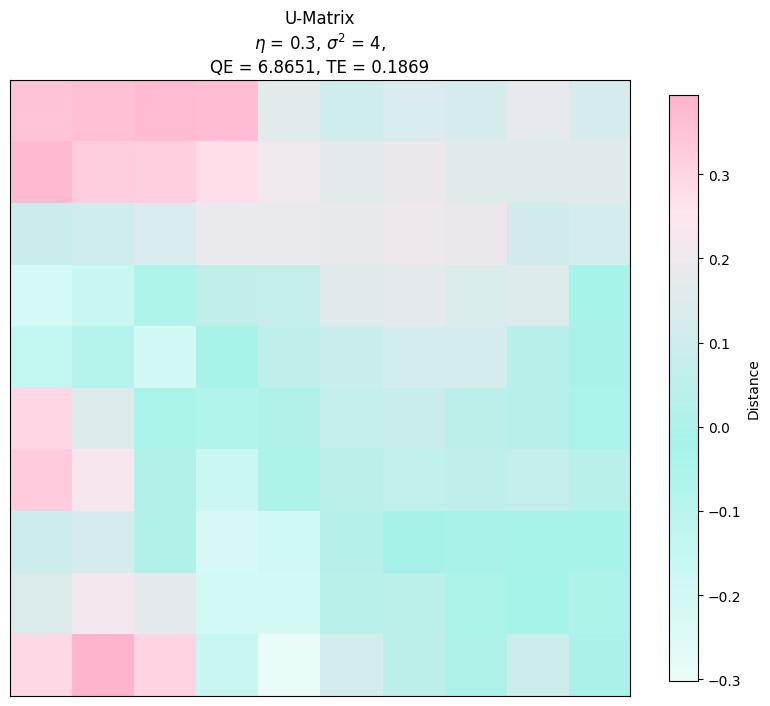

In [71]:
u_matrix_values = u_matrix(SOM7)
QE = round(calculateQE(SOM7, n_train_data7), 4)
TE = round(calculateTE(SOM7, n_train_data7), 4)

plt.figure(figsize=(10, 8))
im = plt.imshow(u_matrix_values, cmap=cmap, aspect='auto')
plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
plt.colorbar(im, shrink=0.95, label='Distance')
plt.xticks([])
plt.yticks([])
plt.show()

In [72]:
SOMimages2 = []
for i in range(len(SOM7)):
    row7 = []
    for j in range(len(SOM7[0])):
        row7.append([])
    SOMimages2.append(row7)

In [73]:
for fi in image_features_dict:
    g,h = find_BMU(SOM7, normalise(train_data7, fi['feature']))
    SOMimages2[g][h].append(fi)

In [74]:
[[len(c) for c in r] for r in SOMimages2]

[[18, 17, 21, 11, 9, 15, 18, 7, 13, 19],
 [20, 7, 7, 15, 9, 5, 5, 8, 10, 12],
 [23, 13, 15, 10, 9, 16, 10, 2, 16, 11],
 [3, 3, 1, 6, 15, 6, 13, 15, 5, 14],
 [24, 1, 18, 6, 7, 4, 7, 6, 9, 5],
 [24, 10, 3, 5, 9, 7, 10, 11, 4, 14],
 [26, 16, 4, 12, 4, 8, 5, 8, 6, 19],
 [11, 12, 14, 0, 8, 6, 11, 4, 8, 6],
 [6, 10, 14, 3, 4, 14, 1, 7, 8, 16],
 [27, 21, 25, 10, 12, 7, 15, 17, 8, 16]]

In [75]:
def distance_between(a, b):
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    return np.linalg.norm(a - b)

In [76]:
def find_closest_image_index(distance):
    closest_index = 0
    distance_closest = distance[0]

    for index in range(1, len(distance)):
        if distance[index] < distance_closest:
            distance_closest = distance[index]
            closest_index = index

    return closest_index

In [77]:
def get_closest_image(a,b):
    cell = SOM7[a][b]
    distance = [distance_between(cell, i['feature']) for i in SOMimages2[a][b]]
    closest_image_index=find_closest_image_index(distance)
    return closest_image_index

In [112]:
def img_reshape(img):
    main_folder_path = r'D:\YeqinHUANG_Collection\ucl\Term3\skill\python\frametest'
    img_path = os.path.join(main_folder_path, img)
    img = Image.open(img_path).convert('RGB')
    # img = img.resize((100, 100))
    img = np.asarray(img)
    return img

In [79]:
from mpl_toolkits.axes_grid1 import ImageGrid
def generate_SOMimages_grid(SOMimages):
    imageGrid = []
    for g in range(len(SOMimages)):
        row = SOMimages[g]
        for h in range(len(row)):
            cell = row[h]
            if len(cell) > 0:
                closest_image_index=get_closest_image(g,h)
                imageGrid.append(cell[closest_image_index]['filename'])
            else:
                imageGrid.append('white.png')
            
    img_arr = []
    for image in imageGrid:
        img_arr.append(img_reshape(image))
        
    fig = plt.figure(figsize=(20., 20.))
    grid = ImageGrid(fig, 111,
                     nrows_ncols=(10, 10),  # creates 2x2 grid of axes
                     axes_pad=0.1,  # pad between axes
                    ) 
    
    for ax, im in zip(grid, img_arr):
        ax.imshow(im)
        ax.axis('off')
    SOMimages_grid=plt.show()
    
    return SOMimages_grid

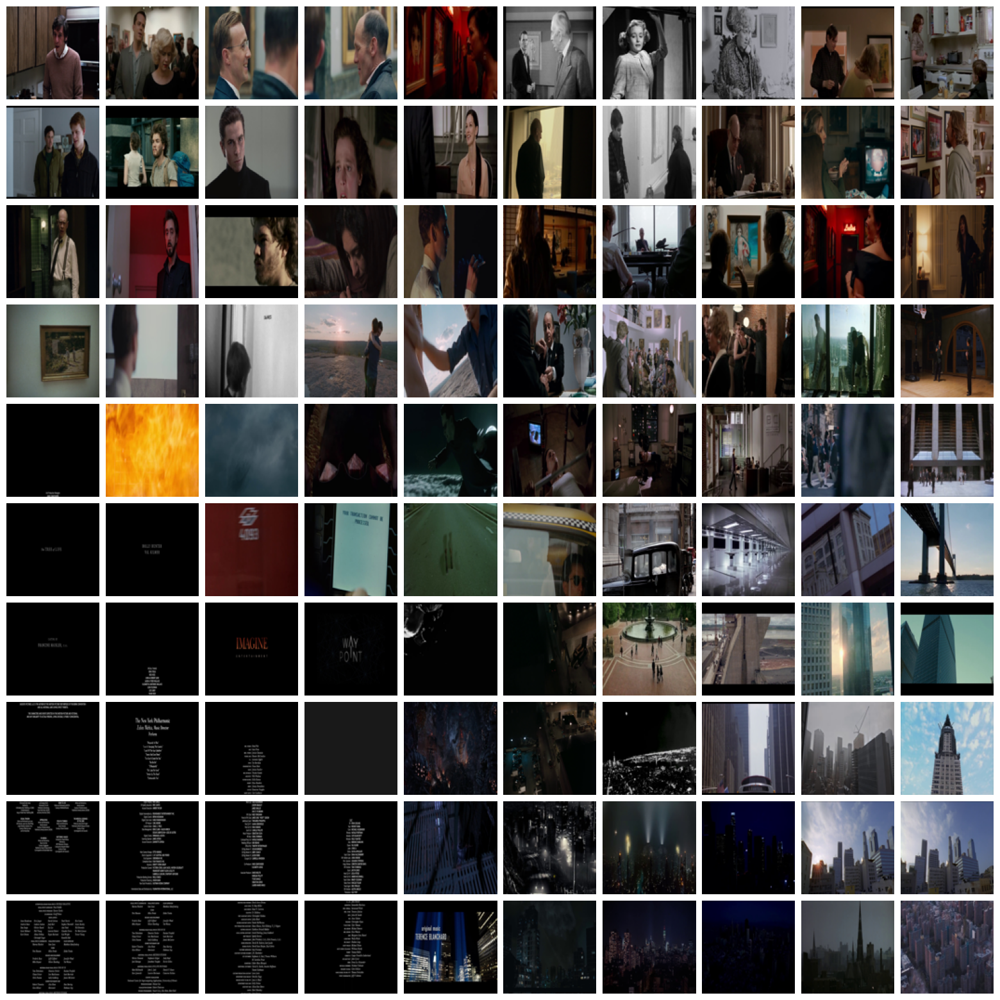

In [80]:
generate_SOMimages_grid(SOMimages2)

In [96]:
video_picture_data_dict3 = [[[] for _ in range(len(SOM7[0]))] for _ in range(len(SOM7))]

# 遍历每个格子中的列表
for row in SOMimages2:
    for cell in row:
        for item in cell:
            if not isinstance(item, dict) or 'feature' not in item or 'filename' not in item:
                continue

            features = item['feature']
            path = item['filename']

            g, h = find_BMU(SOM7, features)

            if 0 <= g < len(SOM7) and 0 <= h < len(SOM7[0]):
                video_picture_data_dict3[g][h].append({'features': features, 'filename': path})
            else:
                print(f"Warning: Index out of range ({g}, {h}) for path: {path}")


In [97]:
def get_closest_image3(a,b):
  cell = SOM7[a][b]
  distance = [distance_between(cell, i['features']) for i in video_picture_data_dict3[a][b]]
  closest_image_index=find_closest_image_index(distance)
  return closest_image_index

In [98]:
def searchvideopicturesom7(query):
    result = []
    query_features = []
    path = query
    q_f = processImage(path, model)
    query_features.append(q_f)

    # 调试信息
    print(f"Query features shape: {np.array(query_features).shape}")
    activatedSOM = activate(n_train_data7, SOM7, query_features)

    # 检查 BMU 查找是否正常
    g, h = find_BMU(SOM7, query_features[0])
    print(f"BMU location: ({g}, {h})")

    # 显示 U-Matrix 结果
    plt.figure(figsize=(5, 4))
    im = plt.imshow(activatedSOM, cmap=cmap, aspect='auto')
    plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4}')
    plt.colorbar(im, shrink=0.95, label='Distance')
    plt.xticks([])
    plt.yticks([])
    plt.show()

    # 获取最近的图像索引
    closest_image_index = get_closest_image2(g, h)
    result.append(video_picture_data_dict3[g][h][closest_image_index]['filename'])
    return result

In [99]:
Path

['D:\\YeqinHUANG_Collection\\ucl\\Term3\\Portfolio\\week3\\museumReinaSofia\\ReinaSofia_943.jpg']

In [152]:
path

'video_96_15s.jpg'

1/1 [==============================] - 0s 28ms/step
Query features shape: (1, 1024)
BMU location: (0, 7)


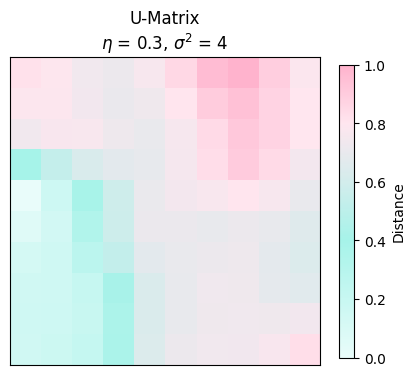

In [153]:
query = Path[0]
result7 = searchvideopicturesom7(query)

In [154]:
result7

['video_109_31s.jpg']

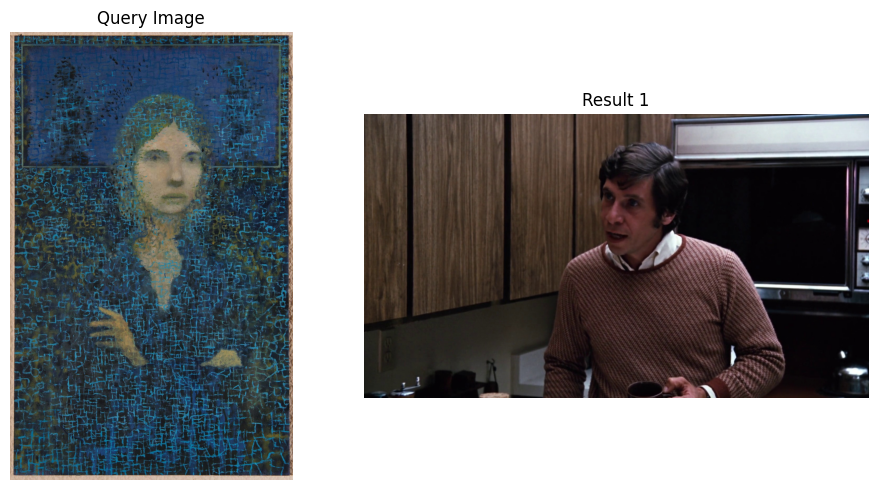

In [155]:
def show_query_and_results(query_image_path, result_image_paths):
    image_paths = [query_image_path] + result_image_paths
    titles = ["Query Image"] + [f"Result {i+1}" for i in range(len(result_image_paths))]

    n_images = len(image_paths)
    fig, axes = plt.subplots(1, n_images, figsize=(5 * n_images, 5))

    if n_images == 1:
        axes = [axes]

    for ax, path, title in zip(axes, image_paths, titles):
        try:
            image = img_reshape(path)
            ax.imshow(image)
            ax.axis('off')
            ax.set_title(title)
        except Exception as e:
            ax.set_title(f"Error: {e}")
            ax.axis('off')

    plt.tight_layout()
    plt.show()

show_query_and_results(query, result7)

In [107]:
import os
import re
from moviepy.editor import VideoFileClip

def extract_video_from_video(video_folder, result7, output_folder):
    for item in result7:
        video_name_with_time = item.split('_')
        video_name = '_'.join(video_name_with_time[:-1]) 
        start_time_str = video_name_with_time[-1]
        
        match = re.search(r'(\d+)s', start_time_str)
        if match:
            start_second = int(match.group(1))
        else:
            print(f"Failed to extract start time from {start_time_str}")
            continue

        # 拼接视频文件路径
        video_path = os.path.join(video_folder, video_name + '.mp4')
        print(f"Processing video: {video_path}")

        try:
            clip = VideoFileClip(video_path)
            end_second = start_second + 5
            subclip = clip.subclip(start_second, end_second)

            output_video_path = os.path.join(output_folder, f'{video_name}_{start_second}s_to_{end_second}s_extracted.mp4')
            subclip.write_videofile(output_video_path, codec='libx264')

            print(f"Extracted video saved to: {output_video_path}")
        except Exception as e:
            print(f"Error processing video {video_path}: {str(e)}")


output_folder = r'D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos'
video_folder = r'D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video'

In [108]:
extract_video_from_video(video_folder, result7, output_folder)

Processing video: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video\video_136.mp4
Moviepy - Building video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_136_5s_to_10s_extracted.mp4.
MoviePy - Writing audio in video_136_5s_to_10s_extractedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_136_5s_to_10s_extracted.mp4



Moviepy - Done !
Moviepy - video ready D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_136_5s_to_10s_extracted.mp4
Extracted video saved to: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_136_5s_to_10s_extracted.mp4


# Search

In [258]:
path_prefix = r"D:\YeqinHUANG_Collection\ucl\Term3\Portfolio\week3\museumPrado"
query_texts = [
    fr"{path_prefix}\Prado_260.jpg",
    fr"{path_prefix}\Prado_721.jpg",
    fr"{path_prefix}\Prado_178.jpg",
    fr"{path_prefix}\Prado_221.jpg",
    fr"{path_prefix}\Prado_249.jpg",
    fr"{path_prefix}\Prado_520.jpg",
    fr"{path_prefix}\Prado_550.jpg",
    fr"{path_prefix}\Prado_999.jpg",
    fr"{path_prefix}\Prado_666.jpg",
    fr"{path_prefix}\Prado_162.jpg"
]

video_folder = r"D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video"
output_folder = r"D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos"

In [244]:
import os
import re
from moviepy.video.io.VideoFileClip import VideoFileClip
import matplotlib.pyplot as plt
from PIL import Image as PILImage

def process_image(query, video_folder, output_folder):
    # 第一阶段查询
    result5 = searchvideopicturesom5(query)
    show_query_and_results(query, result5)
    contents = [item['content'] for item in result5]
    print(contents)
    
    if contents:
        # 使用结果的第一条内容作为新的查询文本
        result6 = search_TextSom1(SOM1, DOC2VEC_MODEL, data_dict1, contents[0])
        print(result6)
    
    if result5:
        # 从第一阶段结果中获取新的查询图像路径
        query_paths = [item['image'] for item in result5]
        new_query = query_paths[0]  # 选择第一张图像路径作为新的查询
        
        # 第二阶段查询
        result7 = searchvideopicturesom7(new_query)
        print(result7)
        
        # 处理第二阶段查询的结果
        for item in result7:
            video_name_with_time = item.split('_')
            video_name = '_'.join(video_name_with_time[:-1])
            start_time_str = video_name_with_time[-1]
            
            match = re.search(r'(\d+)s', start_time_str)
            if match:
                start_second = int(match.group(1))
            else:
                print(f"Failed to extract start time from {start_time_str}")
                continue
            
            video_path = os.path.join(video_folder, video_name + '.mp4')
            print(f"Processing video: {video_path}")
            
            try:
                clip = VideoFileClip(video_path)
                end_second = start_second + 5
                subclip = clip.subclip(start_second, end_second)
                
                # 保存并显示视频的第一帧
                first_frame_image_path = os.path.join(output_folder, f'{video_name}_{start_second}s_first_frame.png')
                subclip.save_frame(first_frame_image_path, t=0)
                img = PILImage.open(first_frame_image_path)
                plt.imshow(img)
                plt.axis('off')
                plt.title(f"第一帧: {video_name}")
                plt.show()
                
                # 保存处理后的视频
                output_video_path = os.path.join(output_folder, f'{video_name}_{start_second}s_to_{end_second}s_extracted.mp4')
                subclip.write_videofile(output_video_path, codec='libx264')
                print(f"Extracted video saved to: {output_video_path}")
                
            except Exception as e:
                print(f"Error processing video {video_path}: {str(e)}")

1/1 [==============================] - 0s 31ms/step
Query features shape: (1, 1024)
BMU location: (11, 0)


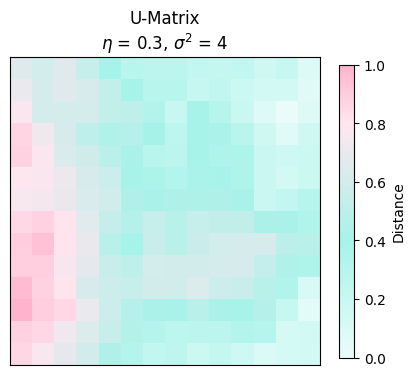

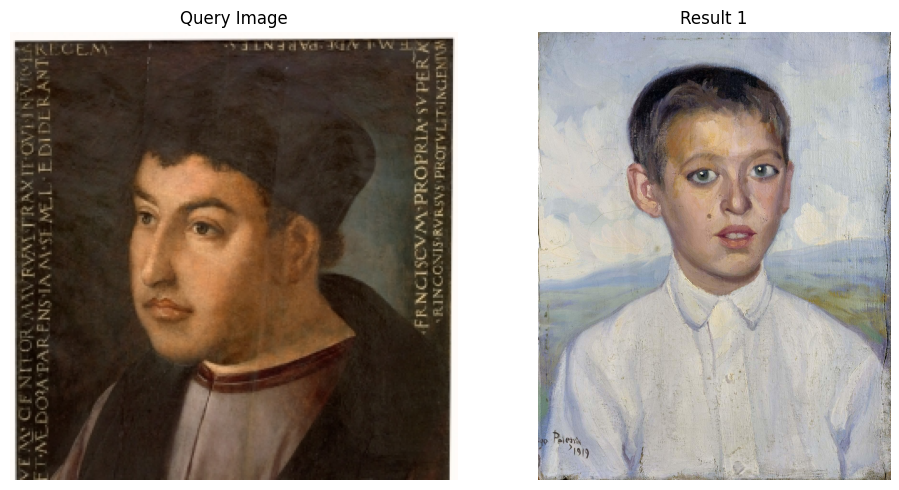

["In this painting, a woman is depicted in a white shirt and a white tie. She is wearing a white dress, and her appearance is classic and elegant. The painting is painted on a white background, which complements the woman's white attire. The painting is framed, adding to its visual appeal and making it even more appealing. The woman"]


<Figure size 640x480 with 0 Axes>

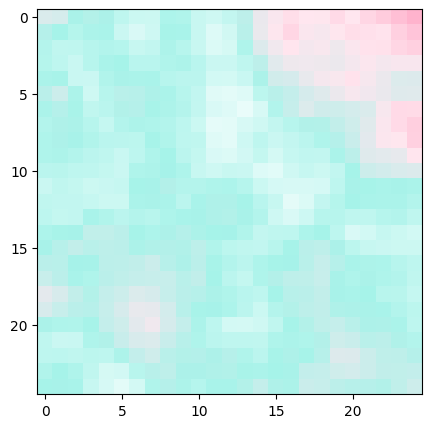

(0, 24)
[' See paragraph 1.E below. 1.C. The Project Gutenberg Literary Archive Foundation (“the Foundation” or PGLAF), owns a compilation copyright in the collection of Project Gutenberg™ electronic works. Nearly all the individual works in the collection are in the public domain in the United States.']
1/1 [==============================] - 0s 26ms/step
Query features shape: (1, 1024)
BMU location: (0, 7)


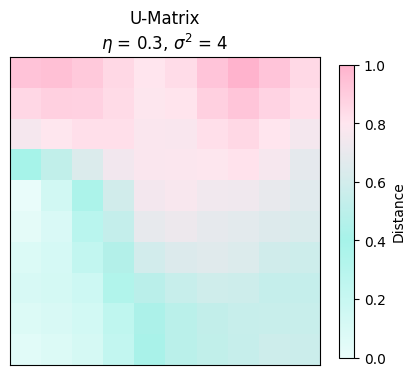

['video_109_31s.jpg']
Processing video: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video\video_109.mp4


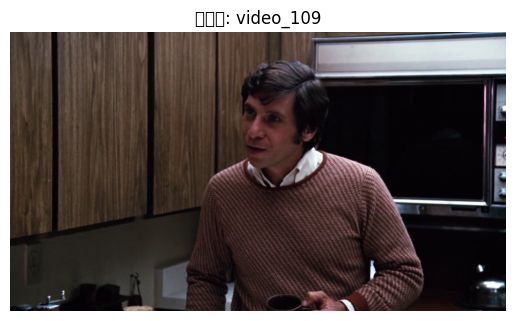

Moviepy - Building video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_109_31s_to_36s_extracted.mp4.
MoviePy - Writing audio in video_109_31s_to_36s_extractedTEMP_MPY_wvf_snd.mp3


Error processing video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video\video_109.mp4: Error in file D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video\video_109.mp4, Accessing time t=32.94-32.98 seconds, with clip duration=32 seconds, 


In [246]:
process_image(query_texts[0], video_folder, output_folder)

1/1 [==============================] - 0s 29ms/step
Query features shape: (1, 1024)
BMU location: (7, 0)


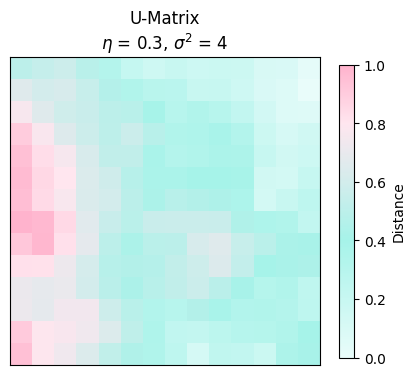

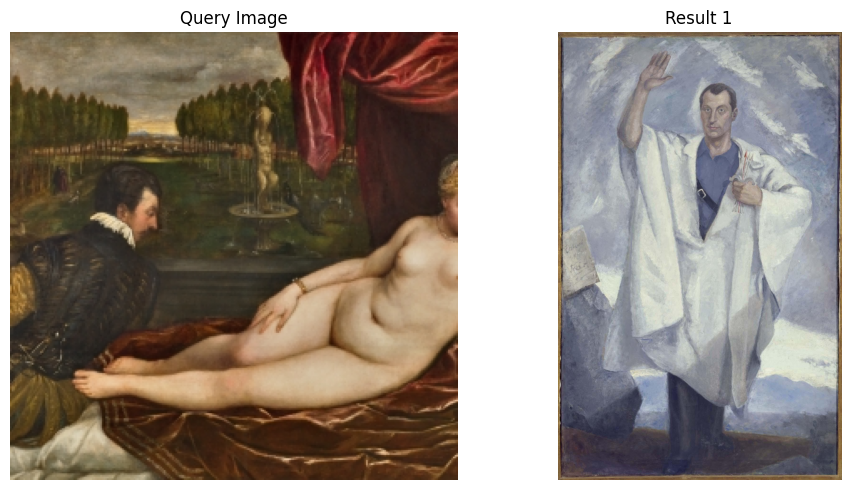

['In the image, there is a painting of a man wearing a white shirt and waving his hand. The painting is painted on a canvas and depicts a man standing in front of a mountainous landscape. The painting is framed and accompanied by a brown frame. The scene is painted with pastel colors, giving it a vintage or artistic appearance. The man']


<Figure size 640x480 with 0 Axes>

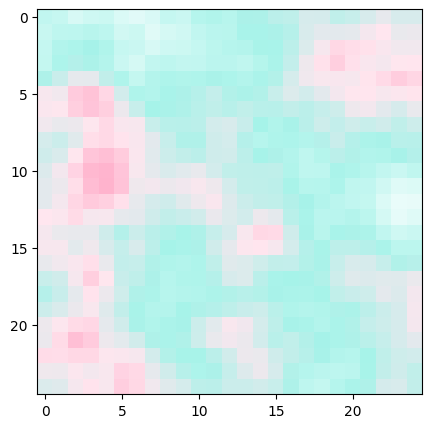

(11, 4)
[' A softer stone has been used with great discretion in the decorative portions of the building. No comprehensive view of the Cathedral is obtainable, so closely do the houses surround it on the south and east, and creep up the hill on which it is built, on the north.']
1/1 [==============================] - 0s 30ms/step
Query features shape: (1, 1024)
BMU location: (0, 7)


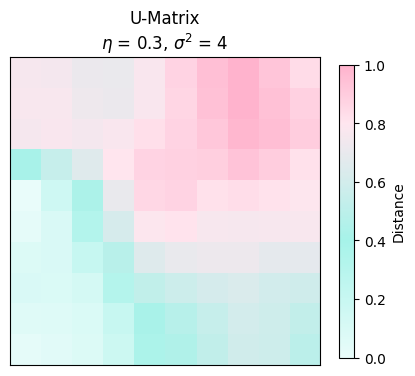

['video_109_31s.jpg']
Processing video: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video\video_109.mp4


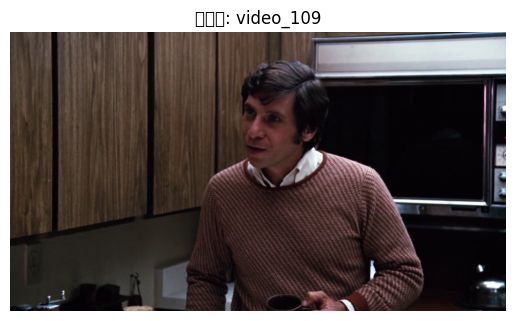

Moviepy - Building video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_109_31s_to_36s_extracted.mp4.
MoviePy - Writing audio in video_109_31s_to_36s_extractedTEMP_MPY_wvf_snd.mp3


Error processing video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video\video_109.mp4: Error in file D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video\video_109.mp4, Accessing time t=32.94-32.98 seconds, with clip duration=32 seconds, 


In [222]:
process_image(query_texts[1], video_folder, output_folder)

1/1 [==============================] - 0s 29ms/step
Query features shape: (1, 1024)
BMU location: (6, 2)


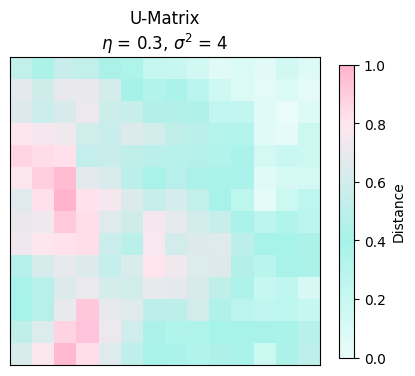

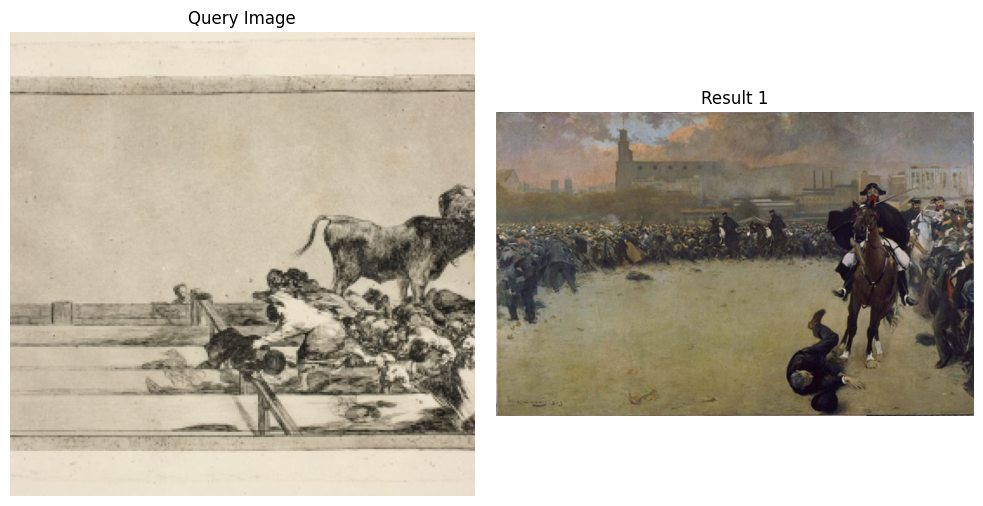

['The image features a painting of a man riding a horse and a crowd of people standing around. The painting captures the scene with a man falling off his horse, seemingly in the middle of a protest or demonstration.\n\nIn addition to the man and horse, there are multiple people present in the scene, some standing closer to the horse while others are farther away. The crowd is dispersed throughout the']


<Figure size 640x480 with 0 Axes>

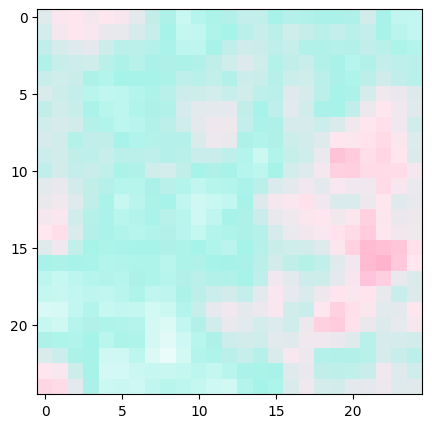

(16, 22)
[' In the centre is a huge cross; the flagstones of the court were all up, and the bones from many disturbed graves were being thrown into a pit. The beautiful cloisters proper are filled with modern opaque glass—"Muy frio" answered the verger to my question, "Por que?"—and no doubt it is in the winter months.']
1/1 [==============================] - 0s 28ms/step
Query features shape: (1, 1024)
BMU location: (3, 7)


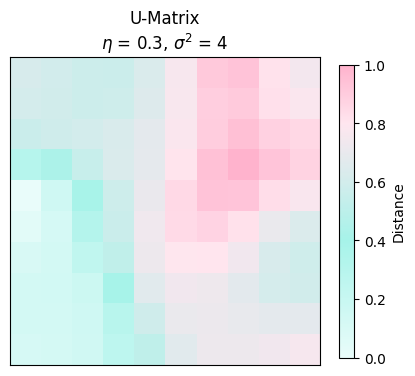

['video_31_10s.jpg']
Processing video: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video\video_31.mp4


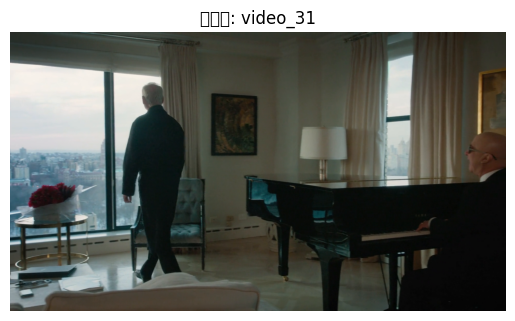

Moviepy - Building video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_31_10s_to_15s_extracted.mp4.
MoviePy - Writing audio in video_31_10s_to_15s_extractedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_31_10s_to_15s_extracted.mp4



Moviepy - Done !
Moviepy - video ready D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_31_10s_to_15s_extracted.mp4
Extracted video saved to: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_31_10s_to_15s_extracted.mp4


In [223]:
process_image(query_texts[2], video_folder, output_folder)

1/1 [==============================] - 0s 68ms/step
Query features shape: (1, 1024)
BMU location: (4, 0)


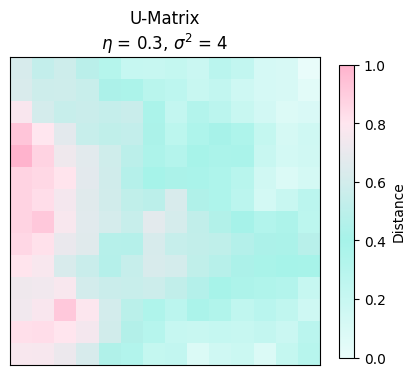

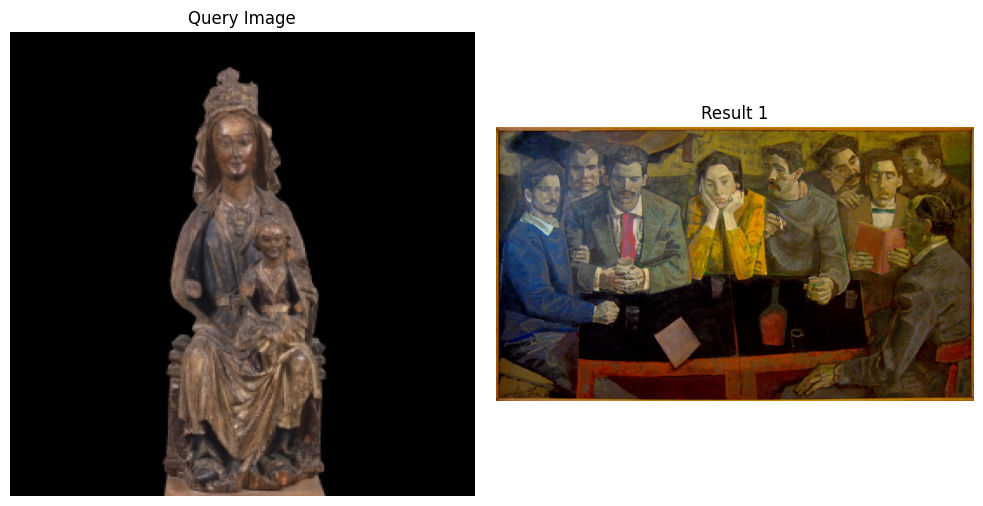

['"\n\nIn the painting, there are four people standing next to each other. They are positioned next to each other, with one person on the left, another on the right, and the other two in the middle of the scene. They are all holding hands.\n\nThe painting is colorful and depicts a lively atmosphere. The people are standing next to each other, creating a sense of unity and shared']


<Figure size 640x480 with 0 Axes>

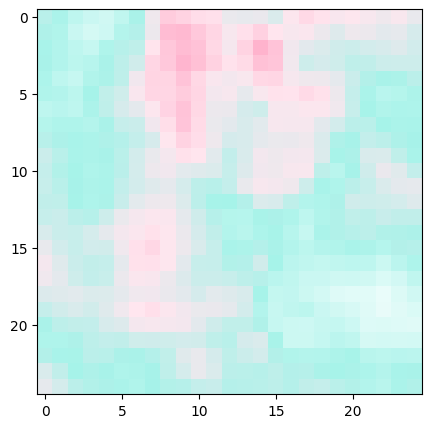

(2, 14)
[' Obedience seems to have been slack; on June 13, 1585, the time limit was extended for four months; then successive prorogations followed and, in 1587, a further delay was accorded until the end of 1588.']
1/1 [==============================] - 0s 28ms/step
Query features shape: (1, 1024)
BMU location: (2, 7)


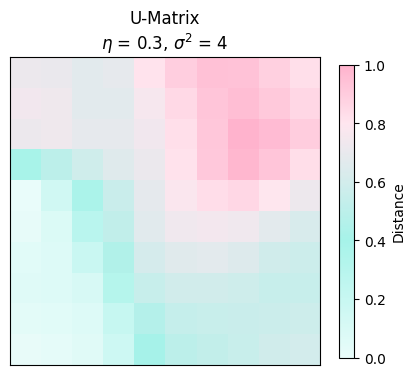

['video_130_5s.jpg']
Processing video: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video\video_130.mp4


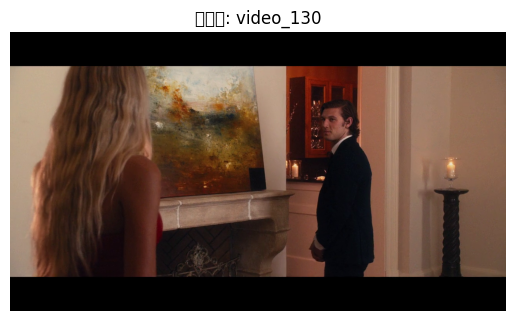

Moviepy - Building video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_130_5s_to_10s_extracted.mp4.
MoviePy - Writing audio in video_130_5s_to_10s_extractedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_130_5s_to_10s_extracted.mp4



Moviepy - Done !
Moviepy - video ready D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_130_5s_to_10s_extracted.mp4
Extracted video saved to: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_130_5s_to_10s_extracted.mp4


In [224]:
process_image(query_texts[3], video_folder, output_folder)

1/1 [==============================] - 0s 32ms/step
Query features shape: (1, 1024)
BMU location: (7, 2)


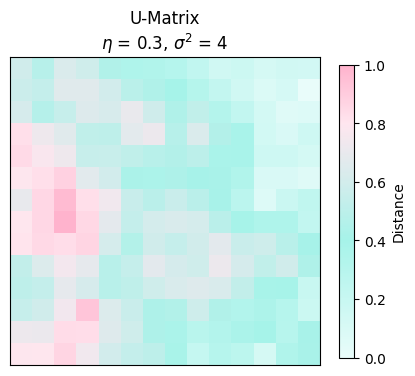

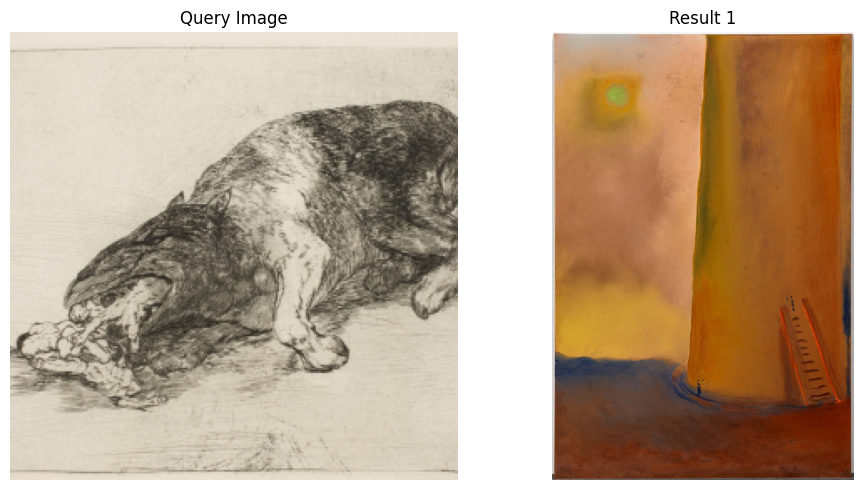

['In the image, there is a painting with a brown background and a yellow hue. The painting is accompanied by a ladder, which suggests that it might be a piece of artwork or a piece of furniture. The ladder is positioned on the left side of the painting, and it appears as though it is leaning against the wall. Additionally, there is a book situated on the left side of the painting, possibly serving as']


<Figure size 640x480 with 0 Axes>

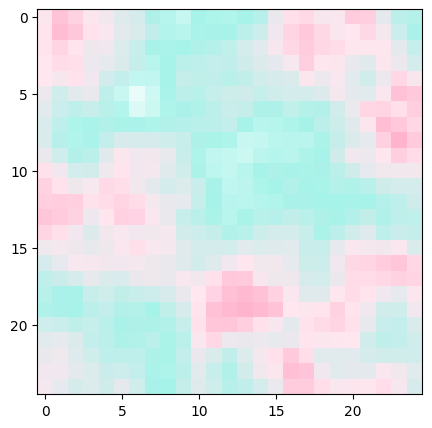

(8, 23)
['[1351] Even books in transit were subject to the watchful eye of the Inquisition, as we learn when, in 1560, some that had belonged to Cardinal Pole were shipped through Spain to Venice and were diligently investigated.']
1/1 [==============================] - 0s 29ms/step
Query features shape: (1, 1024)
BMU location: (6, 9)


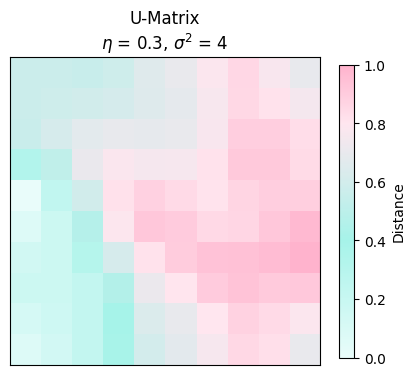

['video_91_5s.jpg']
Processing video: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video\video_91.mp4


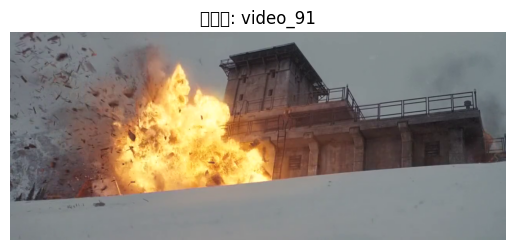

Moviepy - Building video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_91_5s_to_10s_extracted.mp4.
MoviePy - Writing audio in video_91_5s_to_10s_extractedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_91_5s_to_10s_extracted.mp4



Moviepy - Done !
Moviepy - video ready D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_91_5s_to_10s_extracted.mp4
Extracted video saved to: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_91_5s_to_10s_extracted.mp4


In [225]:
process_image(query_texts[4], video_folder, output_folder)

1/1 [==============================] - 0s 29ms/step
Query features shape: (1, 1024)
BMU location: (3, 0)


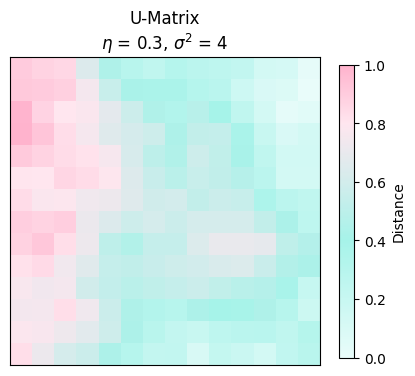

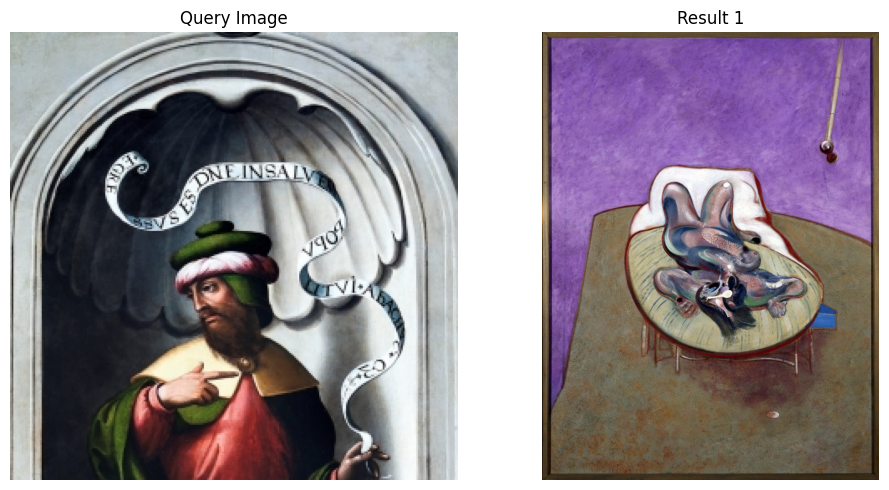

['In the image, there is a painting or drawing of a table with a purple background. On the table, there is a cat lying on its back, seemingly taking a nap or resting. Additionally, there is a dog lying on its back, seemingly sleeping as well.\n\nThe painting or drawing features various objects on the table, including a cup, a']


<Figure size 640x480 with 0 Axes>

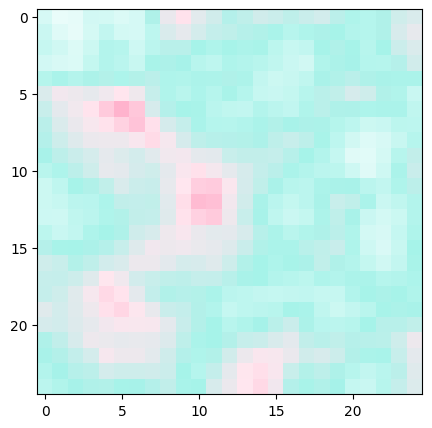

(6, 5)
[' The severity of the infliction varied with his temper and power of invective, but constant practice rendered him skilful in detecting the sensitive places, and in applying the lash where it would be most keenly felt.']
1/1 [==============================] - 0s 28ms/step
Query features shape: (1, 1024)
BMU location: (5, 5)


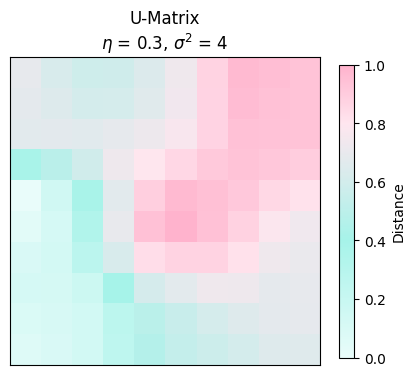

['video_105_15s.jpg']
Processing video: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video\video_105.mp4


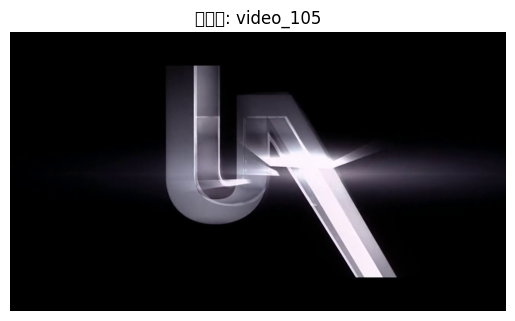

Moviepy - Building video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_105_15s_to_20s_extracted.mp4.
MoviePy - Writing audio in video_105_15s_to_20s_extractedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_105_15s_to_20s_extracted.mp4



Moviepy - Done !
Moviepy - video ready D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_105_15s_to_20s_extracted.mp4
Extracted video saved to: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_105_15s_to_20s_extracted.mp4


In [255]:
process_image(query_texts[5], video_folder, output_folder)

1/1 [==============================] - 0s 30ms/step
Query features shape: (1, 1024)
BMU location: (4, 1)


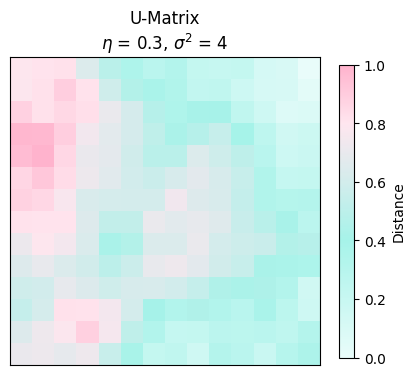

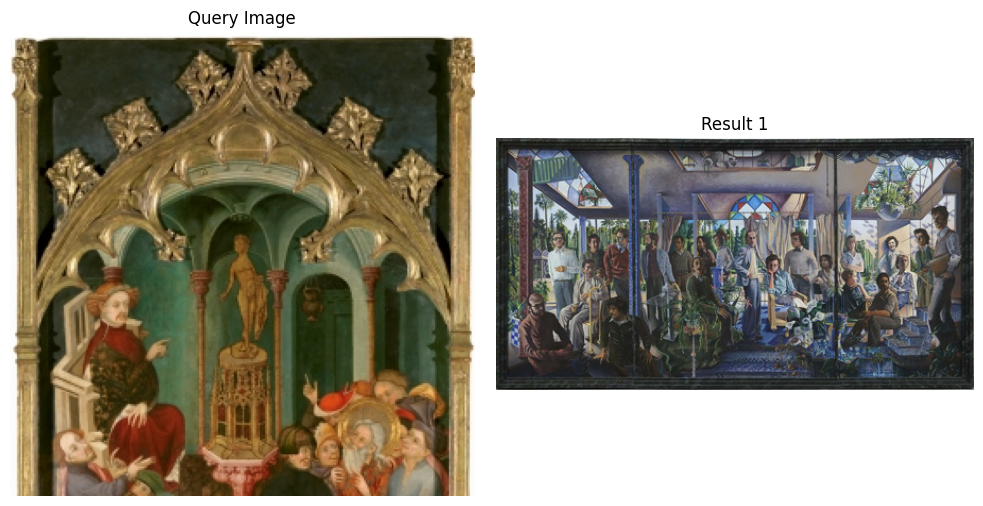

['The image features a painting of people gathered in a room, possibly a restaurant or gathering place. The painting depicts a lively atmosphere with many people engaged in conversation and enjoying their time.\n']


<Figure size 640x480 with 0 Axes>

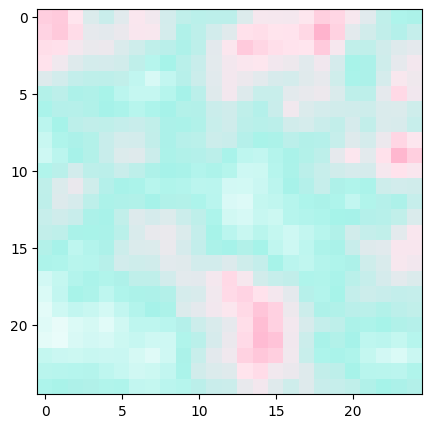

(1, 18)
['[330] The Instructions of 1561 state that, when there is semi-proof, or such indications that the accused cannot be acquitted, there are three remedies, compurgation, torture or abjuration; but this is scarce correct, for those who succeeded in compurgation were always, and those who overcame torture were generally, required to abjure.']
1/1 [==============================] - 0s 28ms/step
Query features shape: (1, 1024)
BMU location: (3, 7)


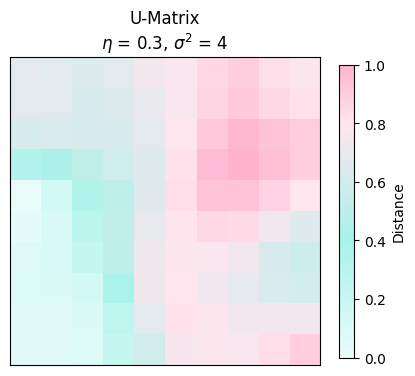

['video_31_10s.jpg']
Processing video: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video\video_31.mp4


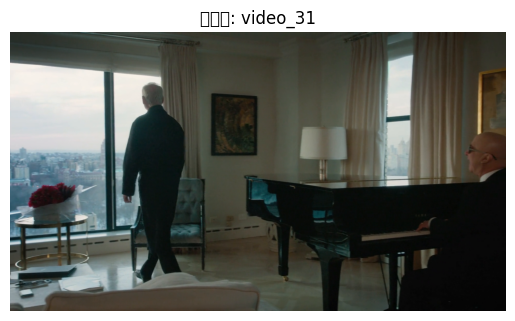

Moviepy - Building video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_31_10s_to_15s_extracted.mp4.
MoviePy - Writing audio in video_31_10s_to_15s_extractedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_31_10s_to_15s_extracted.mp4



Moviepy - Done !
Moviepy - video ready D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_31_10s_to_15s_extracted.mp4
Extracted video saved to: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_31_10s_to_15s_extracted.mp4


In [259]:
process_image(query_texts[6], video_folder, output_folder)

1/1 [==============================] - 0s 31ms/step
Query features shape: (1, 1024)
BMU location: (12, 3)


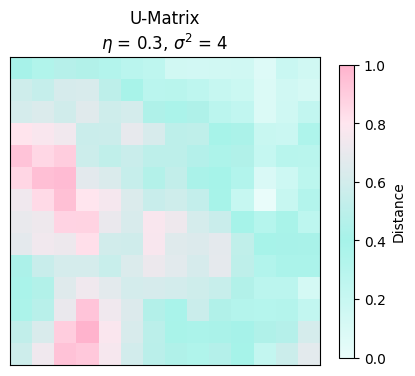

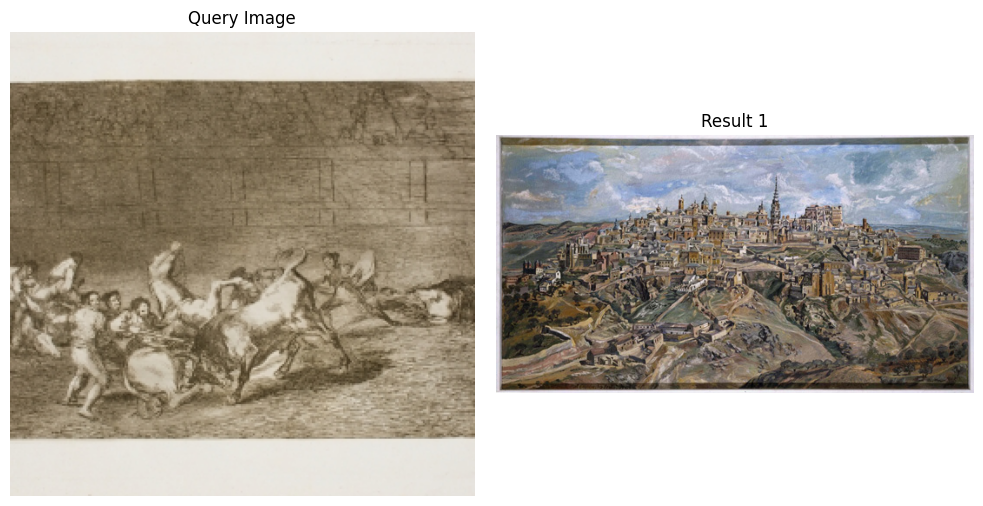

['The image features a cityscape with buildings and spires, surrounded by mountains.\n\nIn the scene, there are multiple buildings, including a large city with spires, a castle, and several other smaller buildings. Additionally, there are spires in various locations throughout the picture. The mountainous landscape surrounding the city is covered in clouds, creating a pictures']


<Figure size 640x480 with 0 Axes>

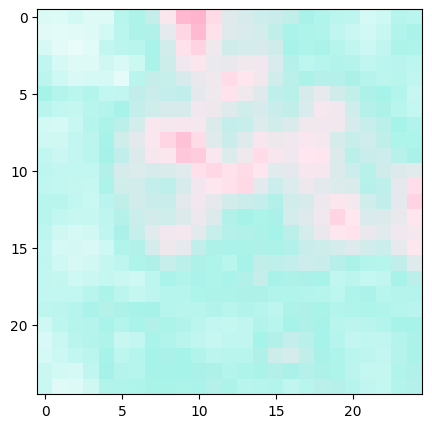

(0, 10)
[' I wandered about hopelessly trying to gain some idea of the exterior of the Cathedral and found that it was only by walking outside the city that anything at all can be seen of it, and then the towers and roof of the nave, with the flying buttresses attached, were the only features that came into view.']
1/1 [==============================] - 0s 29ms/step
Query features shape: (1, 1024)
BMU location: (9, 9)


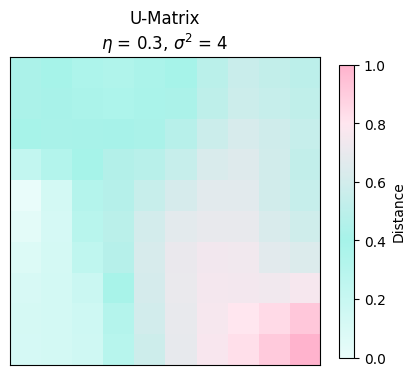

['video_22_10s.jpg']
Processing video: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video\video_22.mp4


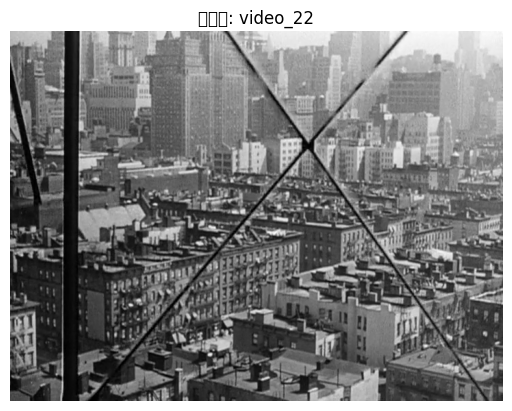

Moviepy - Building video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_22_10s_to_15s_extracted.mp4.
MoviePy - Writing audio in video_22_10s_to_15s_extractedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_22_10s_to_15s_extracted.mp4



Moviepy - Done !
Moviepy - video ready D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_22_10s_to_15s_extracted.mp4
Extracted video saved to: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_22_10s_to_15s_extracted.mp4


In [250]:
process_image(query_texts[7], video_folder, output_folder)

1/1 [==============================] - 0s 29ms/step
Query features shape: (1, 1024)
BMU location: (7, 2)


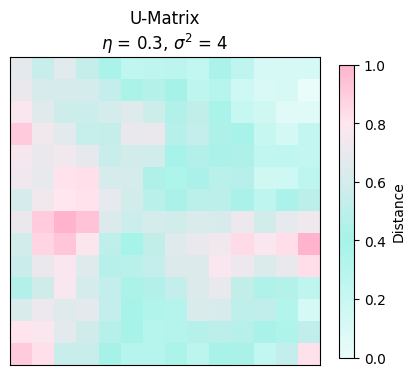

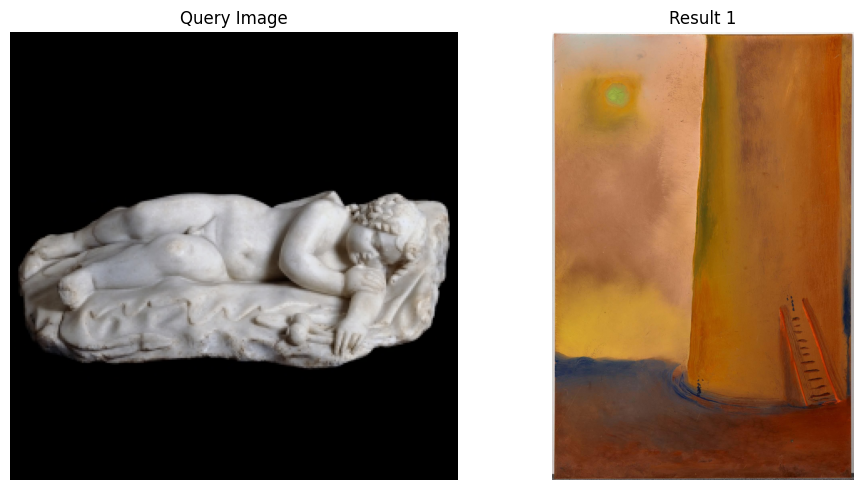

['In the image, there is a painting with a brown background and a yellow hue. The painting is accompanied by a ladder, which suggests that it might be a piece of artwork or a piece of furniture. The ladder is positioned on the left side of the painting, and it appears as though it is leaning against the wall. Additionally, there is a book situated on the left side of the painting, possibly serving as']


<Figure size 640x480 with 0 Axes>

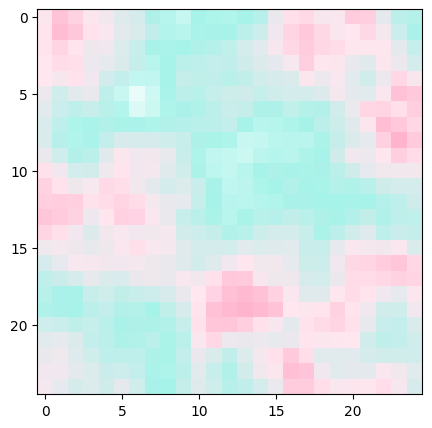

(8, 23)
['[1351] Even books in transit were subject to the watchful eye of the Inquisition, as we learn when, in 1560, some that had belonged to Cardinal Pole were shipped through Spain to Venice and were diligently investigated.']
1/1 [==============================] - 0s 29ms/step
Query features shape: (1, 1024)
BMU location: (6, 9)


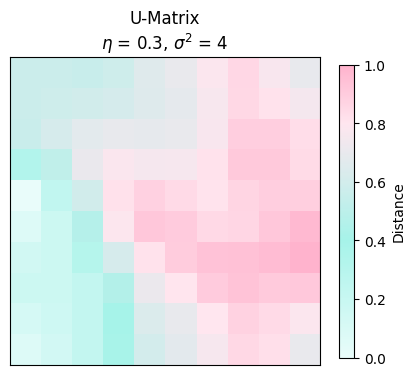

['video_91_5s.jpg']
Processing video: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video\video_91.mp4


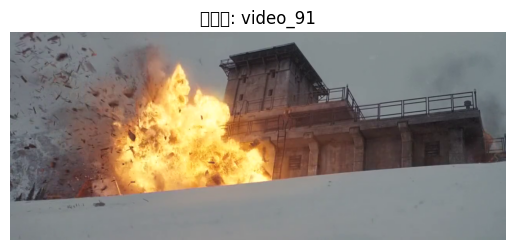

Moviepy - Building video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_91_5s_to_10s_extracted.mp4.
MoviePy - Writing audio in video_91_5s_to_10s_extractedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_91_5s_to_10s_extracted.mp4



Moviepy - Done !
Moviepy - video ready D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_91_5s_to_10s_extracted.mp4
Extracted video saved to: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_91_5s_to_10s_extracted.mp4


In [248]:
process_image(query_texts[8], video_folder, output_folder)

1/1 [==============================] - 0s 29ms/step
Query features shape: (1, 1024)
BMU location: (6, 2)


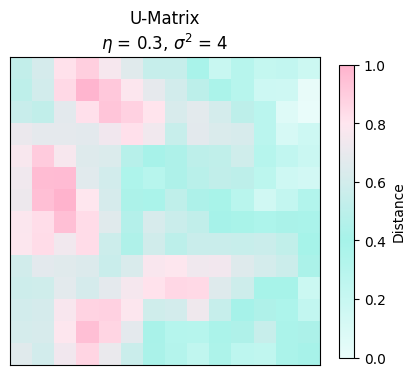

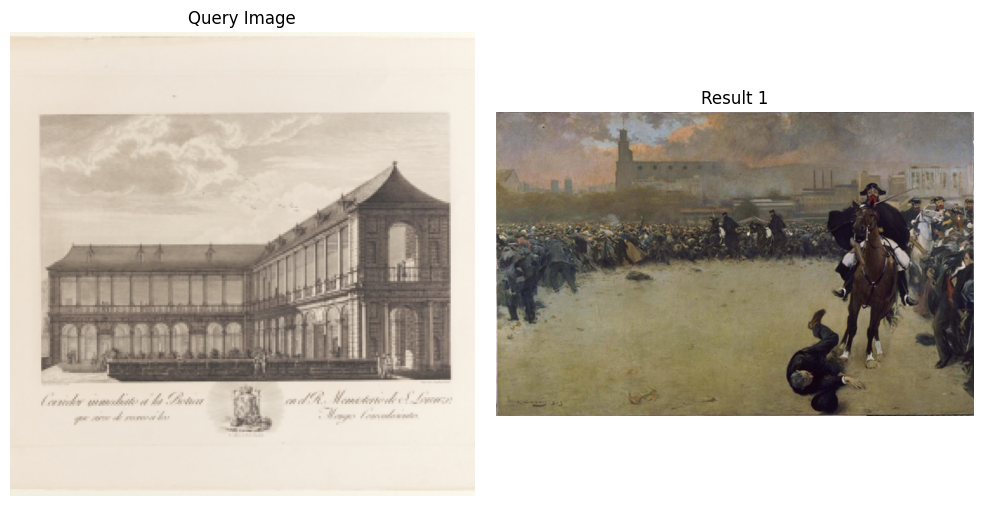

['The image features a painting of a man riding a horse and a crowd of people standing around. The painting captures the scene with a man falling off his horse, seemingly in the middle of a protest or demonstration.\n\nIn addition to the man and horse, there are multiple people present in the scene, some standing closer to the horse while others are farther away. The crowd is dispersed throughout the']


<Figure size 640x480 with 0 Axes>

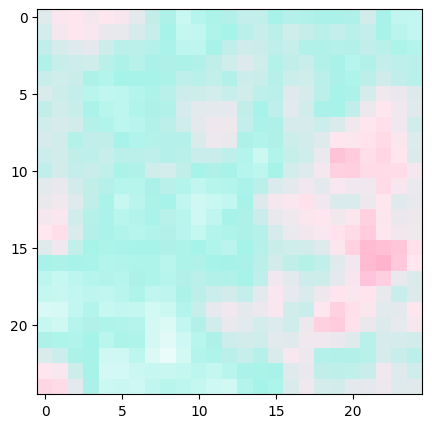

(16, 22)
[' In the centre is a huge cross; the flagstones of the court were all up, and the bones from many disturbed graves were being thrown into a pit. The beautiful cloisters proper are filled with modern opaque glass—"Muy frio" answered the verger to my question, "Por que?"—and no doubt it is in the winter months.']
1/1 [==============================] - 0s 28ms/step
Query features shape: (1, 1024)
BMU location: (3, 7)


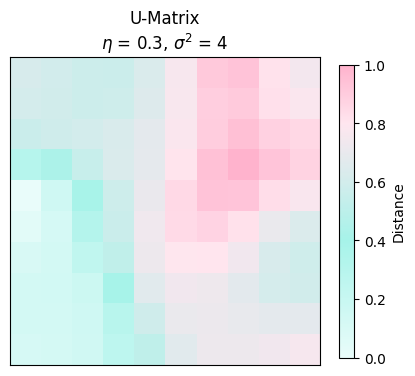

['video_31_10s.jpg']
Processing video: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\database03_video\video_31.mp4


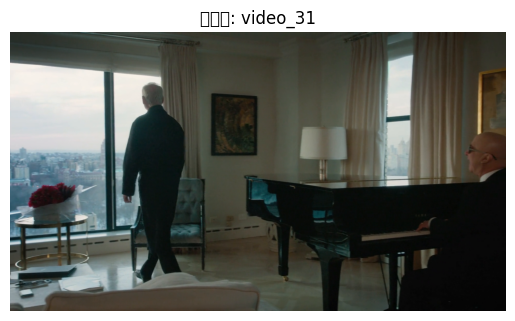

Moviepy - Building video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_31_10s_to_15s_extracted.mp4.
MoviePy - Writing audio in video_31_10s_to_15s_extractedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_31_10s_to_15s_extracted.mp4



Moviepy - Done !
Moviepy - video ready D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_31_10s_to_15s_extracted.mp4
Extracted video saved to: D:\YeqinHUANG_Collection\ucl\Term3\skill\python\output_videos\video_31_10s_to_15s_extracted.mp4


In [235]:
process_image(query_texts[9], video_folder, output_folder)